0.003 dt

## mouse 5 = M13_2018-05-01_11-23-01_of

mouse with 7 neurons

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
from shapely.geometry import LineString, MultiLineString
from shapely.geometry import MultiPoint, Polygon, Point
from utils.plotting import plot_trajectory
import shapely
import matplotlib
import numpy as np
from scipy import stats
from scipy.stats import mannwhitneyu
import seaborn as sns
from scipy import signal
import statsmodels.api as sm
import math
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy import ndimage
from scipy.signal import resample
from utils.plotting import (
    plot_trajectory,
    plot_marks_clusters)
from utils.processing import (
    cluster_marks,
    add_filtered_V,
    normalize_angles_2pi)
import statistics
import os
import numpy.ma as ma
import pickle
from utils.shapely_funcs import (
    marks2shapely,
    plot_intersected_element,
    plot_shapely_traj,
    plot_shapely_mark,
    find_traj_marks_intersections,
    extract_shapely_intersections,
)

### -1. open original df (df_all) 

In [2]:
# это df c данными мышей
#data_frame_with_cells = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")
df_all = pd.read_pickle("C:\\Users\\Lenovo\\Desktop\\навигация\\neuro\\SORTED_CLUSTERS\\sorted_clusters.pkl")



In [5]:
df_all['session_id'].value_counts().head(15)

session_id
M11_2018-03-12_17-58-58_of    12
M5_2018-02-26_16-47-52_of      9
M5_2018-02-15_17-23-36_of      8
M5_2018-02-16_15-57-18_of      7
M5_2018-03-01_13-29-52_of      7
M5_2018-02-27_16-38-15_of      7
M13_2018-05-08_12-06-39_of     6
M13_2018-05-01_11-23-01_of     6
M13_2018-04-24_12-30-49_of     6
M7_2018-03-12_15-16-29_of      6
M12_2018-03-26_14-00-10_of     6
M5_2018-02-22_17-34-12_of      6
M13_2018-04-19_12-34-28_of     6
M8_2018-03-19_10-59-51_of      6
M12_2018-03-29_12-51-01_of     5
Name: count, dtype: int64

In [3]:
df_1sess = df_all.loc[df_all['session_id']=='M13_2018-05-01_11-23-01_of']
df_1sess

,session_id,cluster_id,position_x,position_y,hd,firing_maps,firing_times,trajectory_hd,trajectory_x,trajectory_y,trajectory_times
13,M13_2018-05-01_11-23-01_of,14,"[33.27852147727273, 34.29730556818182, 34.2973...","[4.073934204545455, 4.075459204545455, 4.07545...","[69.5412696056348, 71.23319685550403, 71.23319...","[[9.4213778269952, 9.486495048485589, 9.366173...","[17319.0, 18814.0, 19352.0, 19819.0, 22071.0, ...",0 50.569835 1 51.524449 2 ...,0 19.737734 1 20.727764 2 ...,0 3.480300 1 3.496910 2 ...,0 0.009455 1 0.041890 2 ...
15,M13_2018-05-01_11-23-01_of,16,"[19.737734204545454, 20.727764431818184, 21.71...","[3.480300113636364, 3.496910340909091, 3.51352...","[50.56983538430442, 51.52444866710057, 52.4790...","[[41.06578409463599, 42.33766725031726, 43.768...","[76.0, 943.0, 1575.0, 1984.0, 2588.0, 2954.0, ...",0 50.569835 1 51.524449 2 ...,0 19.737734 1 20.727764 2 ...,0 3.480300 1 3.496910 2 ...,0 0.009455 1 0.041890 2 ...
21,M13_2018-05-01_11-23-01_of,22,"[35.83215784090909, 41.600316931818185, 42.714...","[5.163756931818182, 3.5258182954545454, 3.6189...","[84.42275338950822, 65.49529007169896, 70.4152...","[[3.042197039790599, 3.0643753694257465, 3.144...","[30734.0, 60181.0, 63702.0, 72791.0, 115680.0,...",0 50.569835 1 51.524449 2 ...,0 19.737734 1 20.727764 2 ...,0 3.480300 1 3.496910 2 ...,0 0.009455 1 0.041890 2 ...
24,M13_2018-05-01_11-23-01_of,25,"[21.71779465909091, 21.71779465909091, 22.7078...","[3.5135205681818182, 3.5135205681818182, 3.530...","[52.47906194989672, 52.47906194989672, 53.4336...","[[30.684953004544923, 30.93208329051525, 31.31...","[1850.0, 2210.0, 3421.0, 3855.0, 5187.0, 6256....",0 50.569835 1 51.524449 2 ...,0 19.737734 1 20.727764 2 ...,0 3.480300 1 3.496910 2 ...,0 0.009455 1 0.041890 2 ...
26,M13_2018-05-01_11-23-01_of,27,"[21.71779465909091, 26.667945795454546, 30.579...","[3.5135205681818182, 3.5965717045454553, 3.073...","[52.47906194989672, 57.25212836387746, 49.2484...","[[15.555732096883427, 15.211224110163695, 15.0...","[2404.0, 6814.0, 12313.0, 91940.0, 100832.0, 1...",0 50.569835 1 51.524449 2 ...,0 19.737734 1 20.727764 2 ...,0 3.480300 1 3.496910 2 ...,0 0.009455 1 0.041890 2 ...
28,M13_2018-05-01_11-23-01_of,29,"[20.727764431818184, 22.70782488636364, 23.697...","[3.496910340909091, 3.5301307954545456, 3.5467...","[51.52444866710057, 53.43367523269286, 54.3882...","[[28.82229034454651, 28.957447103032905, 29.14...","[524.0, 2872.0, 4311.0, 5706.0, 9090.0, 9279.0...",0 50.569835 1 51.524449 2 ...,0 19.737734 1 20.727764 2 ...,0 3.480300 1 3.496910 2 ...,0 0.009455 1 0.041890 2 ...


check whether trajectory_x are equal in rows from same session

### 0.5. Functions

In [4]:
# def occupMapNorm(df, binn, eps=0.1):
#     """ 
#     делаем df где будет понятно сколько было точек в каждом бине 
#     соответсвуеющему данному интервалу х и данному интервалу у
#     """
#     xmin = df["x"].min() - eps
#     xmax = df["x"].max() + eps
#     binx = np.linspace(xmin, xmax, binn)
#     x_cut = pd.cut(df.x, binx, right=False)

#     ymin = df["y"].min() - eps
#     ymax = df["y"].max() + eps
#     biny = np.linspace(ymin, ymax, binn)
#     y_cut = pd.cut(df.y, biny, right=False)

#     dfn = df.groupby([x_cut, y_cut], observed=False).count()
    
#     dfn = dfn.drop(columns=['x', 'y'])
#     dfn = dfn.rename(columns={'time': 'Count'})
    
#     #сделаем df с норм числами в индексах, а не с интервалами
#     L = [(a.mid, b.mid) for a, b in dfn.index]
#     dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
#     dd = dfm.unstack()
#     arrd = dd.replace(0, 1e-2).to_numpy()
#     arrsrsr = np.sqrt(np.sqrt(np.sqrt(arrd)))

#     return arrsrsr
#     #return arrsrsr, (binx, biny)

def occupMapNotNorm(df, binn, eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).count()
    
    dfn = dfn.drop(columns=['x', 'y'])
    dfn = dfn.rename(columns={'time': 'Count'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    # arrd = dd.replace(0., 1).to_numpy()
    # arrl = np.log(arrd)
    # arrl = df_minmax(arrl)
    
    #rotate to traj
    dd = dd.transpose()
    dd = dd.iloc[::-1]
    return dd, (binx, biny)

#таблица с траекторией
def makebasDF(n):
    x = df_all['trajectory_x'].iloc[n] 
    y = df_all['trajectory_y'].iloc[n]
    time = df_all['trajectory_times'].iloc[n]
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

def makebasDF2(row):
    x = row['trajectory_x']
    y = row['trajectory_y']
    time = row['trajectory_times']
    zipped = list(zip(time,x, y))

    df = pd.DataFrame(zipped, columns=['time', 'x', 'y'])
    #df = df.loc[df['time']<=1000]
    #print(df)
    #plot_trajectory(df['x'],df['y'])
    return df

def makebasNpfromRow(row):
    x = row['trajectory_x']
    y = row['trajectory_y']
    time = row['trajectory_times']
    tr_np = np.dstack((time, x, y))
    return tr_np[0]

def rescale_coord(data, new_min, new_max):
    min_old_x, max_old_x = np.min(data), np.max(data)
    data_rescaled = ((data - min_old_x) / (max_old_x - min_old_x)) * (new_max - new_min) + new_min
    return data_rescaled

#near corner: code 50
#near wall (not near corner): code 5
#center: code 0
def sort_walls_area_simple(tr, border_tr, wall_percent=0.1): 
    ylen = border_tr['ymax'] - border_tr['ymin'] 
    xlen = border_tr['xmax'] - border_tr['xmin'] 
    xl = border_tr['xmin'] + xlen * wall_percent
    xr = border_tr['xmax'] - xlen * wall_percent
    yd = border_tr['ymin'] + ylen * wall_percent
    yu = border_tr['ymax'] - ylen * wall_percent

    tr['near_wall'] = 0.
    for i in range(len(tr)):     
        if tr['x'].iloc[i] < xl:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 50
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 50
            else:
                tr['near_wall'].iloc[i] = 5
        elif tr['x'].iloc[i] > xr:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 50
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 50
            else:
                tr['near_wall'].iloc[i] = 5
        elif tr['y'].iloc[i] > yu:
            tr['near_wall'].iloc[i] = 5
        elif tr['y'].iloc[i] < yd:
            tr['near_wall'].iloc[i] = 5
    return tr

def plotNs(df, t, signals_list, deltat=0.5):
    t1 = t-deltat/2
    t2 = t+deltat/2
    df = df.loc[(df['time']>=t1)&(df['time']<=t2)]
    plt.figure(figsize=(15,4))
    for s in signals_list:
        plt.plot(df['time'], df[s], label=s)
    plt.axvline(x=t, color='m')
    plt.legend()
    plt.show()
    return df

#def cutNs(df, t, signals_list, deltat=0.5):
    


### 1. Plot heatmaps of spikes

#### make df with trajectory points during spikes

In [5]:
df_1sess['cluster_id']

13    14
15    16
21    22
24    25
26    27
28    29
Name: cluster_id, dtype: int64

In [8]:
#can be skipped
print('max, min')
print('position_x',max(df_1sess.loc[df_1sess['cluster_id']==14]['position_x'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==14]['position_x'].iloc[0]))
print('position_y',max(df_1sess.loc[df_1sess['cluster_id']==14]['position_y'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==14]['position_y'].iloc[0]))
print('trajectory_x',max(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_x'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_x'].iloc[0]))
print('trajectory_y',max(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_y'].iloc[0]),min(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_y'].iloc[0]))
xma_old = max(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_x'].iloc[0])
xmi_old = min(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_x'].iloc[0])
yma_old = max(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_y'].iloc[0])
ymi_old = min(df_1sess.loc[df_1sess['cluster_id']==14]['trajectory_y'].iloc[0])

max, min
position_x 99.5306578409091 0.5058173863636364
position_y 101.37474556818182 1.5570603409090906
trajectory_x 102.11986238636364 0.0
trajectory_y 101.95741602272727 0.0


In [9]:
def rescale_coord_add(data, new_min, new_max, min_old_x, max_old_x):
    #min_old_x, max_old_x = np.min(data), np.max(data)
    data_rescaled = ((data - min_old_x) / (max_old_x - min_old_x)) * (new_max - new_min) + new_min
    return data_rescaled

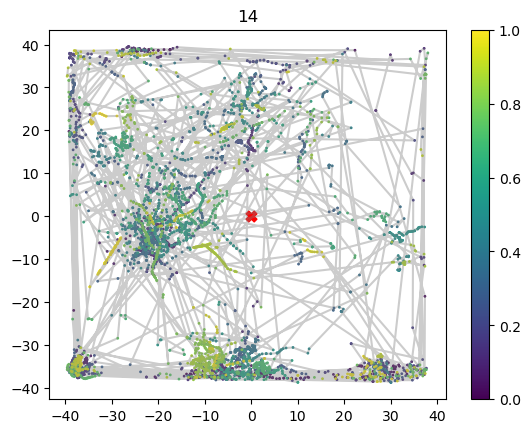

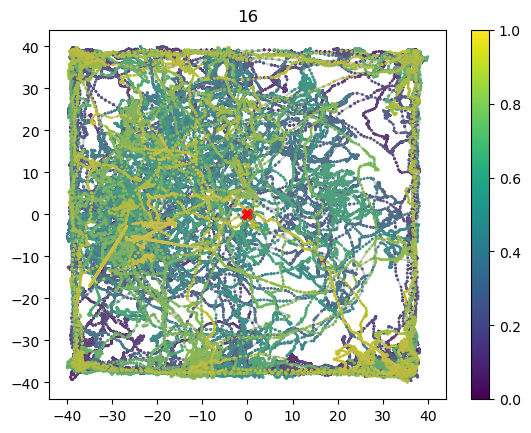

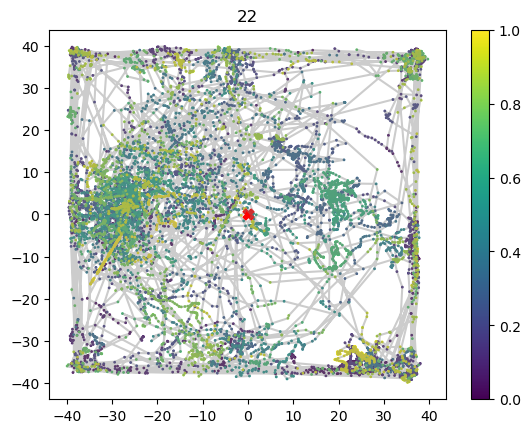

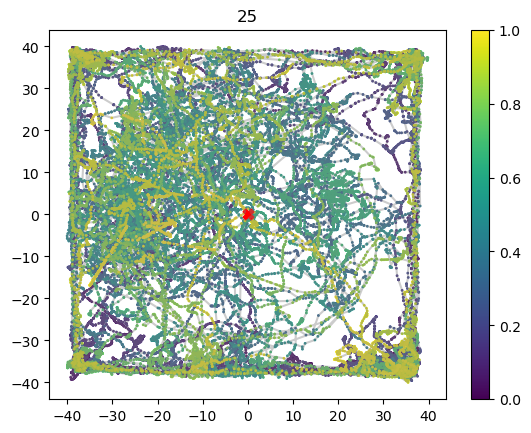

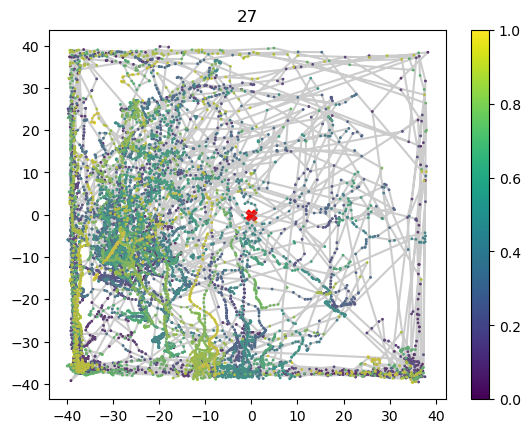

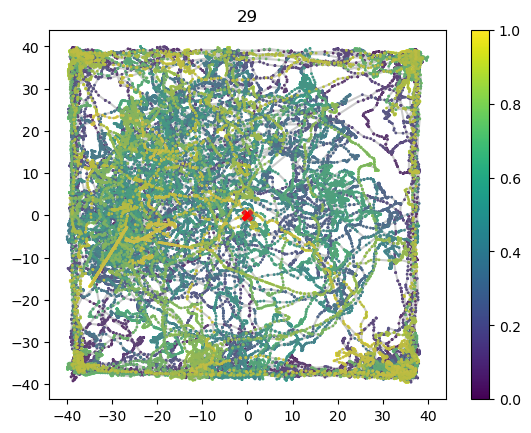

In [10]:
clust_ns = df_1sess['cluster_id'].tolist()
spike_dfs = {}
for n in clust_ns:
    x = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['position_x'].iloc[0]), -40, 40, xmi_old, xma_old) 
    y = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['position_y'].iloc[0]), -40, 40, ymi_old, yma_old) 
    t = df_1sess.loc[df_1sess['cluster_id']==n]['firing_times'].iloc[0] / 30000
    plot_trajectory(x, y, title=str(n))
    F = pd.DataFrame({'time': t, 'x': x, 'y': y})
    spike_dfs[n] = F

In [11]:
#make occupancy heatmaps

In [9]:
# def cut_jumps(df, xmax, xmin, ymax, ymin, show=True):
#     """
#     Simply drops samples with jumps onto the walls
#     """
#     dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
#     ind = range(0, len(dff))
#     dff = dff.reindex(ind)
#     if show:
#         # plot_trajectory(dff['x'], dff['y'])
#         print('not implemented')
#     return dff

In [12]:
#spike_dfs

#### (not important) occ map not norm not smoothed

In [17]:
from scipy import ndimage

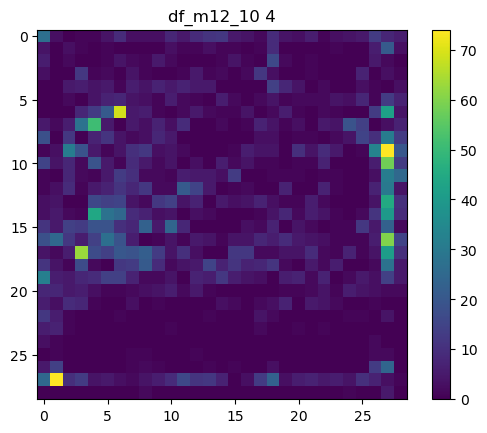

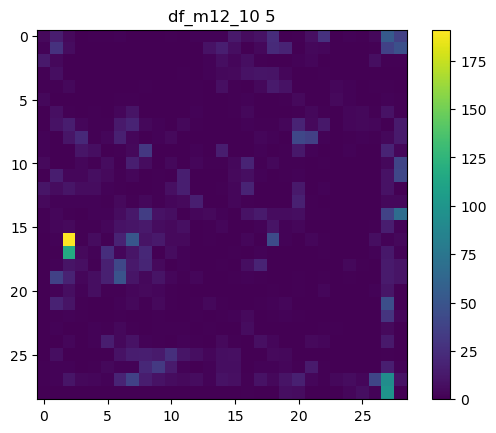

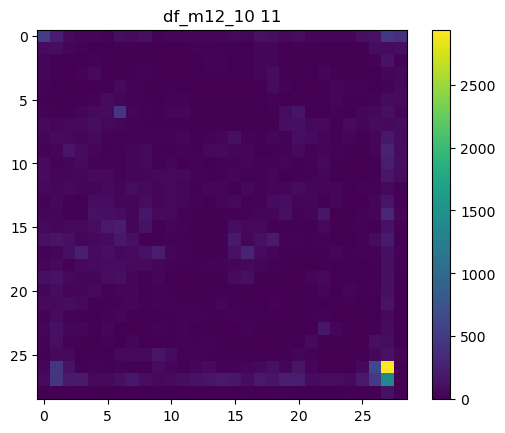

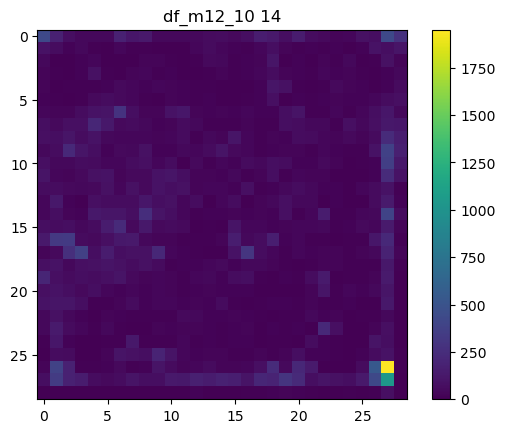

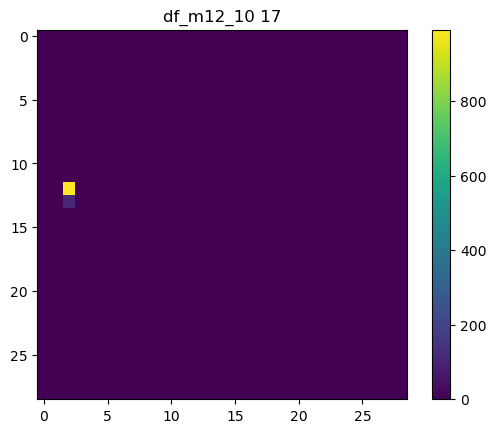

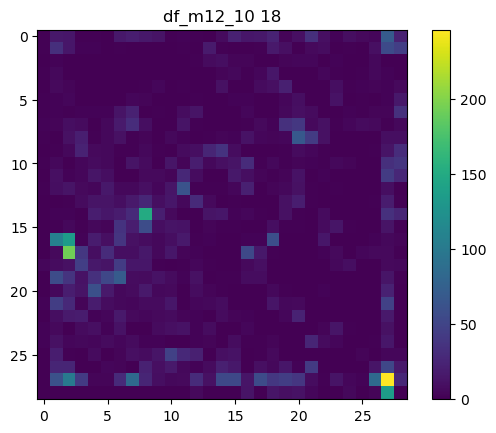

In [49]:
occ_traj_fire = {}
bins = {}
for n in spike_dfs:
    k = 'df_m12_10'
    k_add = ' '+str(n)
    occ, b = occupMapNotNorm(spike_dfs[n], binn=30)
    #occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
    # sns.heatmap(occ, square=True, xticklabels=False,
    #             yticklabels=False, cmap='Blues')
    occ_traj_fire[n] = occ
    bins[n] = b
    plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + k_add)
    plt.colorbar()
    #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
    # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
    plt.show()   

In [39]:
for k, dd in occ_traj_fire.items():
    print(k)
    print(dd)

4
          Count                                                          \
y       2.0455  5.5005  8.9555  12.4105 15.8660 19.3215 22.7765 26.2315   
x                                                                         
1.7024        0      25       5       0       3       6      12       6   
5.2095        0      74      14       1       1       7       6       3   
8.7165        0      10       0       0       0       1       1       9   
12.2235       0      13       0       0       0       0       0       8   
15.7305       0       4       0       0       0       0       0       1   
19.2375       0       5       0       0       0       0       0       0   
22.7445       0       3       0       0       0       0       1       0   
26.2515       0       2       1       1       0       0       0       3   
29.7585       2       4       2       1       0       0       0       0   
33.2655       0       6       1       0       0       0       0       1   
36.7725       0       9

#### correctly rotated occ map not norm not smoothed

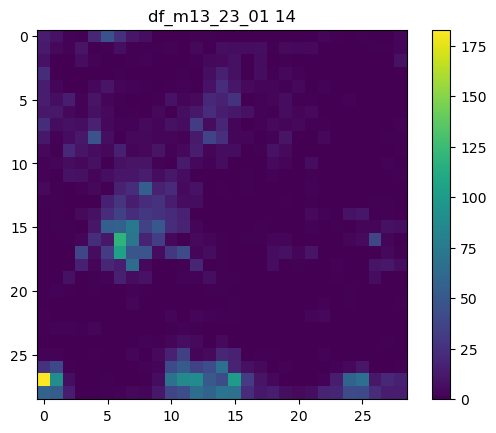

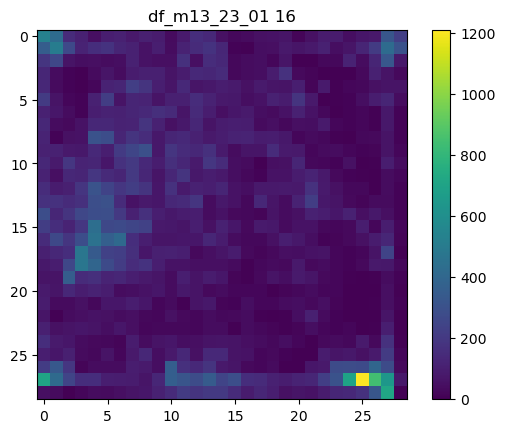

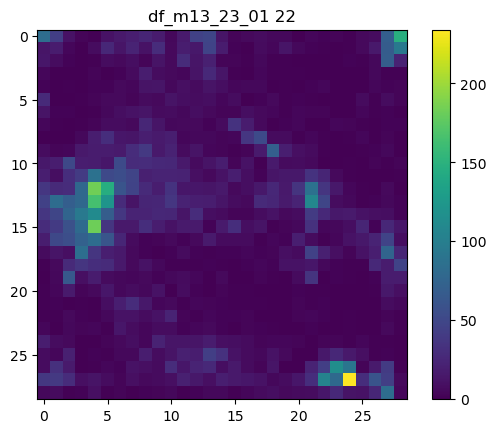

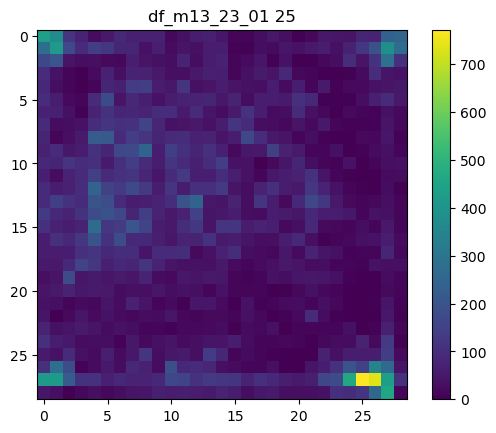

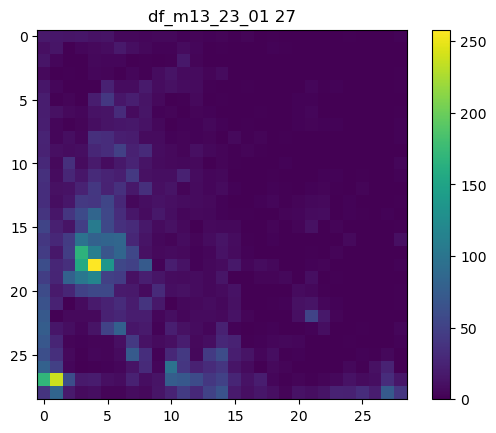

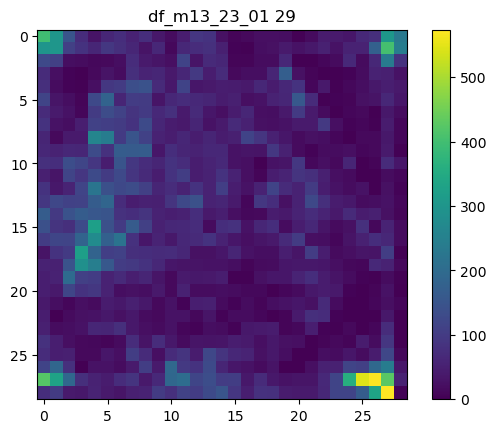

In [12]:
occ_traj_fire = {}
bins = {}
for n in spike_dfs:
    k = 'df_m13_23_01'
    k_add = ' '+str(n)
    occ, b = occupMapNotNorm(spike_dfs[n], binn=30)
    #occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
    # sns.heatmap(occ, square=True, xticklabels=False,
    #             yticklabels=False, cmap='Blues')
    occ_traj_fire[n] = occ
    bins[n] = b
    plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + k_add)
    plt.colorbar()
    #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
    # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
    plt.show()   

In [14]:
# for k, dd in occ_traj_fire.items():
#     print(k)
#     print(dd)

#### (not important) occ map not norm smoothed

In [417]:

for n in spike_dfs:
    k = 'df_m12_10'
    k_add = ' '+str(n)
    occ = occupMapNotNorm(spike_dfs[n], binn=30)
    occ_s = ndimage.fourier_gaussian(occ, 1, n=-1)
    # sns.heatmap(occ, square=True, xticklabels=False,
    #             yticklabels=False, cmap='Blues')
    
    plt.imshow(occ_s) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + k_add)
    plt.colorbar()
    #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
    # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
    plt.show()   

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\ndimage\_fourier.py:119: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  input = numpy.asarray(input)


RuntimeError: data type not supported

In [24]:
# for n in spike_dfs:
#     k = 'df_m12_10'
#     k_add = ' '+str(n)
#     occ = occupMapNorm(spike_dfs[n], binn=40)
#     #occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
#     # sns.heatmap(occ, square=True, xticklabels=False,
#     #             yticklabels=False, cmap='Blues')
    
#     plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
#     plt.title(k + k_add)
#     plt.colorbar()
#     #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
#     # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
#     plt.show()   

In [13]:
# #occupancy map
# n = 17
# k = 'df_m12_10'
# k_add = ' '+str(n)
# occ = occupMapNotNorm(spike_dfs[n], binn=40)
# occ_s = ndimage.fourier_gaussian(occ, 0.8, n=-1)
# # sns.heatmap(occ, square=True, xticklabels=False,
# #             yticklabels=False, cmap='Blues')

# plt.imshow(occ_s) #interpolation='bilinear', cmap='rainbow')
# plt.title(k + k_add)
# plt.colorbar()
# #k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
# plt.show()

#### HM based on mean (not count)

##### make occ map of whole trajectory

and replace low values with 0

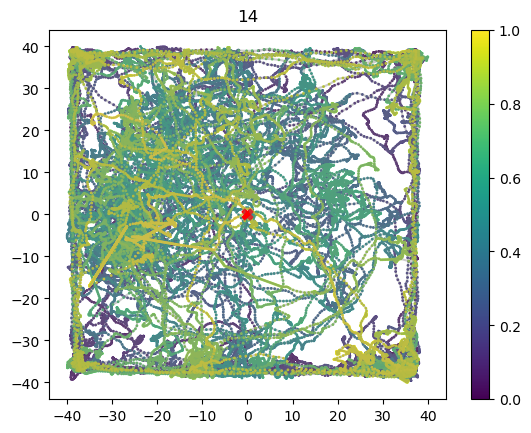

In [15]:
clust_ns = df_1sess['cluster_id'].tolist()
n = clust_ns[0]
x = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['trajectory_x'].iloc[0]), -40, 40, xmi_old, xma_old) 
y = rescale_coord_add(np.array(df_1sess.loc[df_1sess['cluster_id']==n]['trajectory_y'].iloc[0]), -40, 40, ymi_old, yma_old) 
t = df_1sess.loc[df_1sess['cluster_id']==n]['trajectory_times'].iloc[0]
plot_trajectory(x, y, title=str(n))
F = pd.DataFrame({'time': t, 'x': x, 'y': y})
traj_whole = F

In [16]:
traj_whole['time'].max() / len(traj_whole) * 30

#0.03324162160298444 * 30

0.9972404851238745

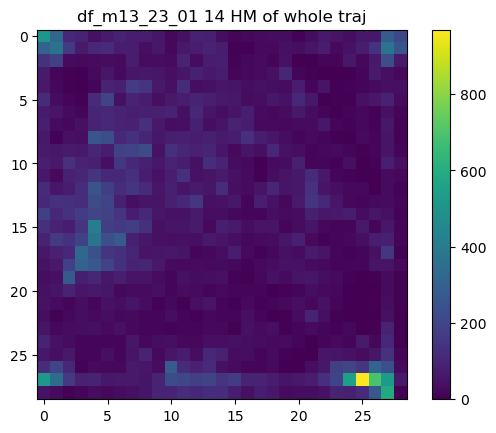

In [17]:
k = 'df_m13_23_01'
k_add = ' '+str(n) + ' HM of whole traj'
occ_whole, binxy_whole = occupMapNotNorm(traj_whole, binn=30)
plt.imshow(occ_whole) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
#k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# plt.savefig(d+'occ_map_'+k+k_add2+'.png')
plt.show()   

In [39]:
# occ_whole_np = occ_whole.to_numpy()

In [40]:
# flat = occ_whole_np.flatten()
# print('3o %:',np.percentile(flat, 30))
# print('35 %:',np.percentile(flat, 35))
# print('20 %:',np.percentile(flat, 20))

In [41]:
occ_whole_np = occ_whole.to_numpy()

occ_whole_np[occ_whole_np < 30.] = 0

occ_whole = pd.DataFrame(occ_whole_np, columns=list(range(29)))

In [17]:
# dt = (1945.313759 - 0.030712) / len(traj_whole)
# 1 / dt

##### divide occ map of trajectory with spikes by whole trajectory i take them for further analysis

In [21]:
# occ_fire_np4 = occ_traj_fire[4].to_numpy()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_728\4091530904.py:6: RuntimeWarning: divide by zero encountered in divide
  occ_fire_divide_np[n] = occ_traj_fire[n].to_numpy() / occ_whole_np
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_728\4091530904.py:6: RuntimeWarning: invalid value encountered in divide
  occ_fire_divide_np[n] = occ_traj_fire[n].to_numpy() / occ_whole_np


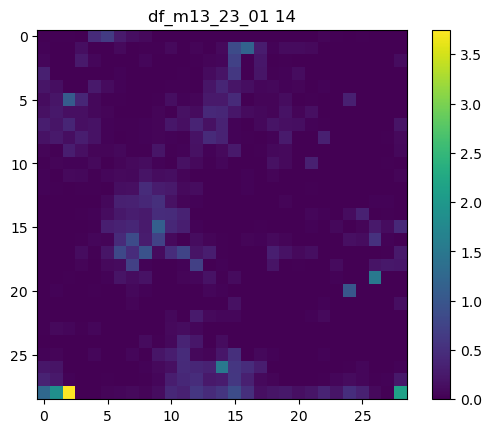

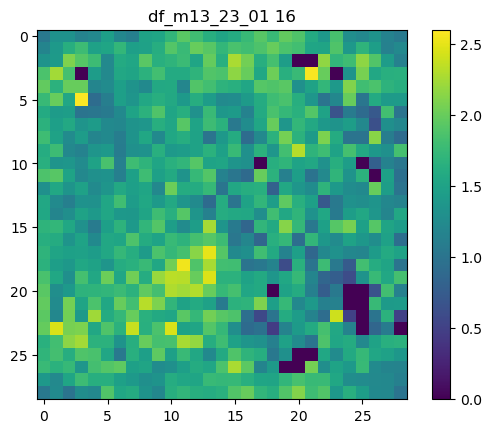

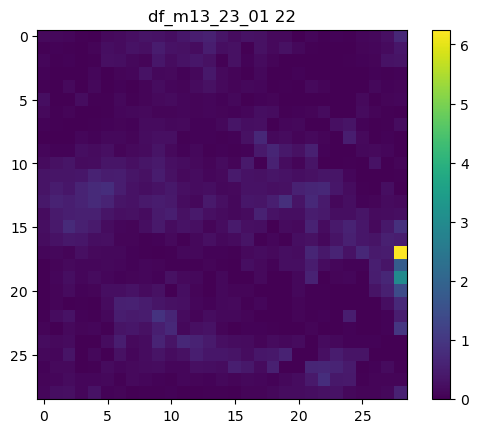

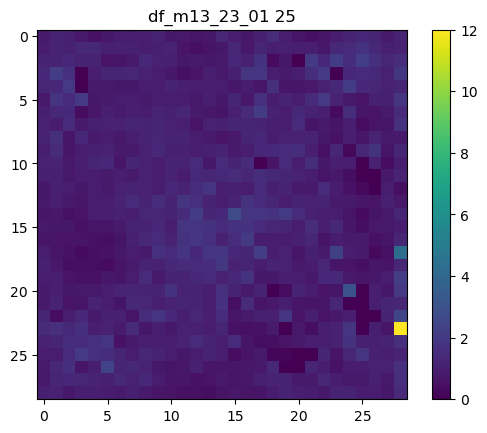

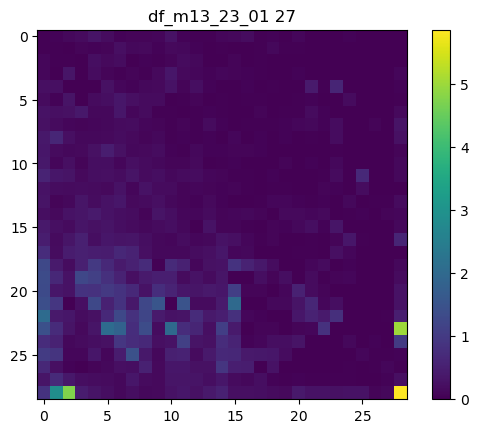

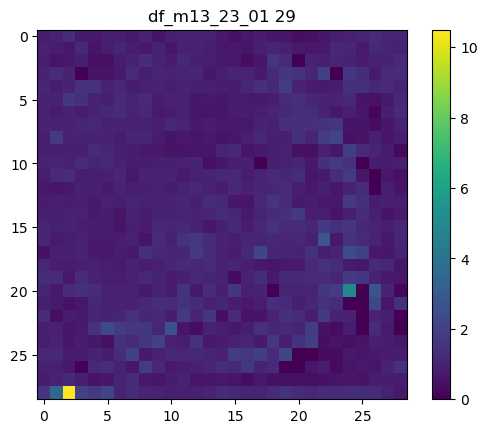

In [20]:
#occ_fire_divide_np - dict with np arrays
occ_whole_np = occ_whole.to_numpy()
k = 'df_m13_23_01'
occ_fire_divide_np = {}
for n in occ_traj_fire:
    occ_fire_divide_np[n] = occ_traj_fire[n].to_numpy() / occ_whole_np
    occ_fire_divide_np[n] = np.nan_to_num(occ_fire_divide_np[n],0,0,0)
    occ_fire_divide_np[n] = np.around(occ_fire_divide_np[n], decimals=3)
    plt.imshow(occ_fire_divide_np[n]) #interpolation='bilinear', cmap='rainbow')
    plt.title(k + ' ' + str(n))
    plt.colorbar()
    plt.show()
        

In [22]:
dfs_divide = {}
for k, arr in occ_fire_divide_np.items():
    dfs_divide[k] = pd.DataFrame(arr, columns=list(range(29))) 
    #print(k)
    #print(arr)

In [23]:
pickle.dump(dfs_divide, open( "mouse5_hm_divide.p", "wb"))

#### hm to points

In [24]:
#7 функция окууп карта меток dfHM
#parameter to change!!!!! n
# тут, может есть лишние вращения, но изначально (до этого шага) и в результате этого шага все расположено правильно, 
# в единой системе координат
#поч немного поменялось расположение меток, наверное, были смещены границы/бины
from utils.processing import df_minmax

#METKA_THRESH = 0.4
#BINN = 30
#SCALING = 'log'

#def make_occup_map(df, n=20, eps=1e-3, scaling='sqrt', show=True):

#8 делаем координаты новых "меток" - центров квадратов, в которых достаточно много меток
def heat_maps_with_coords(dfHM, binxy, k=0.5, tit='', show=True):
    
    # 1. threshold
    METKA_THRESH = k * dfHM.to_numpy().max()
    
    
    # 2. occ map in which indices are coordinates
    binx, biny = binxy
    binxmid, binymid = [], []
    for i in range(1, len(binx)):
        binxmid.append((binx[i] + binx[i-1]) / 2)
        binymid.append((biny[i] + biny[i-1]) / 2)
    dfHM.index = binxmid[::-1]
    dfHM.columns = binymid

    # 3. take coordinates of cells with sufficient amount of urine marks 
    # координаты меток т.е. i это y (row) а j это x (column)
    # parameter to change 0.3
    trN_coords, trN_coeff = [], []
    for i in range(dfHM.shape[0]-1, -1, -1):
        for j in range(dfHM.shape[1]):
            if dfHM.iloc[i, j] > METKA_THRESH:
                trN_coords.append((dfHM.columns[j], dfHM.index[i]))
                trN_coeff.append((dfHM.iloc[i, j]))
    if show:
        plt.figure(figsize=(4, 4))
        plt.xlim(-40, 40)
        plt.ylim(-40, 40)
        trN_coords_x = [i[0] for i in trN_coords]
        trN_coords_y = [i[1] for i in trN_coords]
        plt.scatter(trN_coords_x, trN_coords_y)
        plt.title(tit)
        plt.show()

    return trN_coords, trN_coeff

# hm_marks_coords = {}
# hm_marks_coeff = {}
# for n in used_mice:
#     df = rescaled_marks[n]
#     df['c'] = np.ones((rescaled_marks[n].shape[0])) # instead of time

#     marks_coords, mark_coeff = heat_maps_with_coords(df, tit=n)
#     hm_marks_coords[n] = marks_coords
#     hm_marks_coeff[n] = mark_coeff

##### threshold selection (skip if already done)

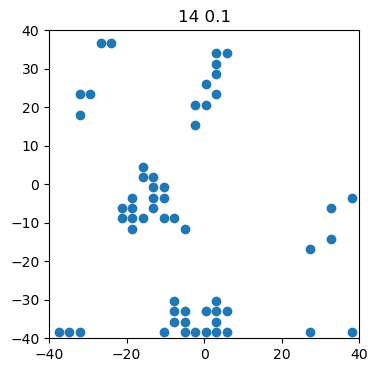

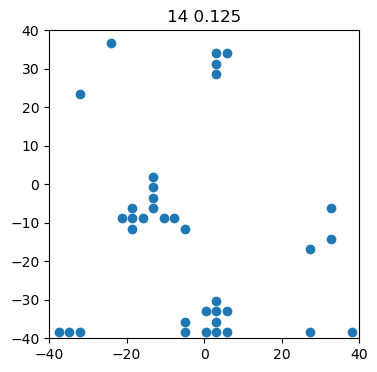

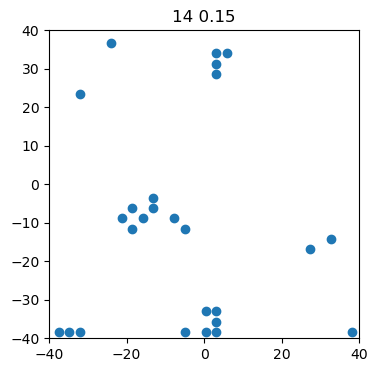

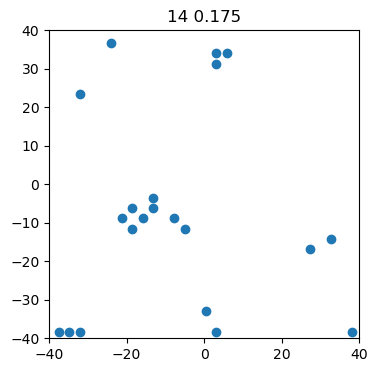

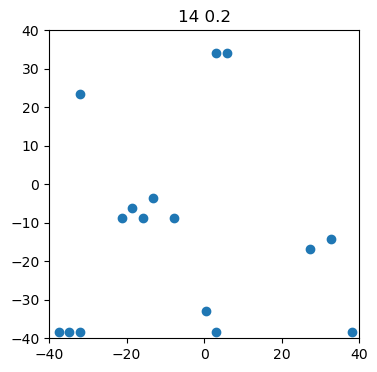

...

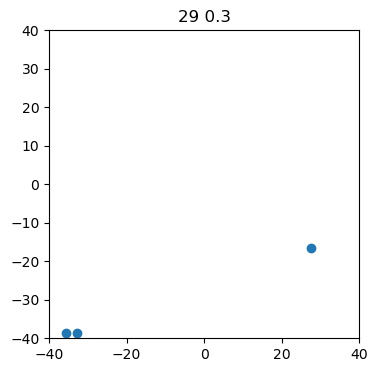

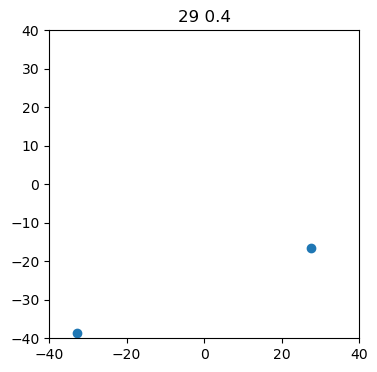

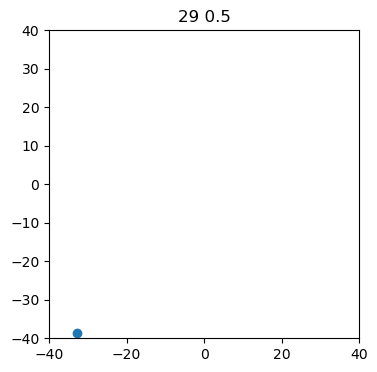

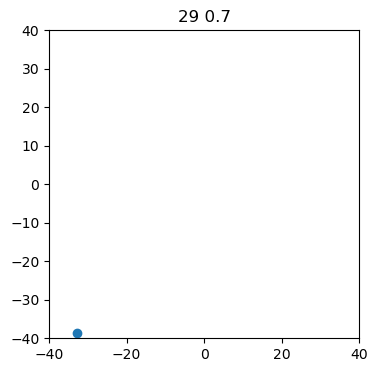

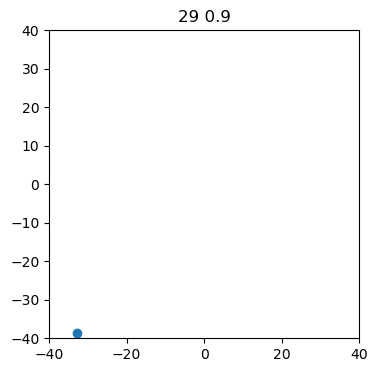

In [28]:
n_points_dict = {}
for k in dfs_divide:
    n_points = []
    for i in (0.1, 0.125, 0.15, 0.175, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9):
        coord, coeff = heat_maps_with_coords(dfs_divide[k], bins[k], k=i, tit=str(k)+' '+str(i))
        n_points.append(len(coord))
    n_points_dict[k] = n_points

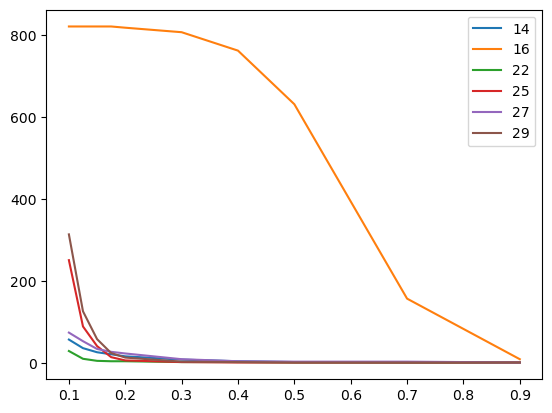

In [29]:
for m, n_p in n_points_dict.items():
    plt.plot((0.1, 0.125, 0.15, 0.175, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9), n_p, label=str(m))
plt.legend()

In [30]:
threses = {14: 0.18, 16: 0.7, 22:0.18, 25:0.18, 27:0.18, 29:0.18}

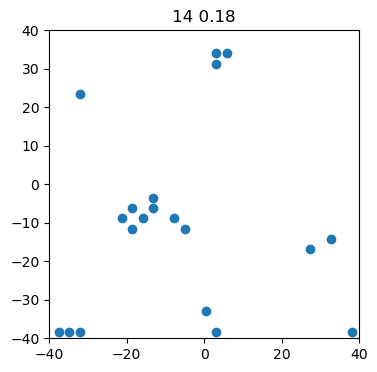

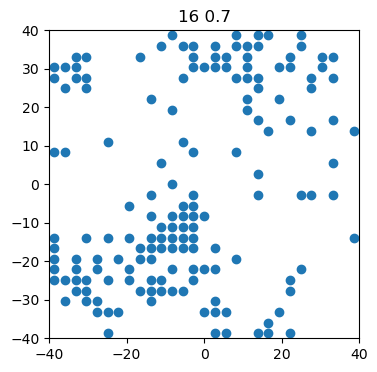

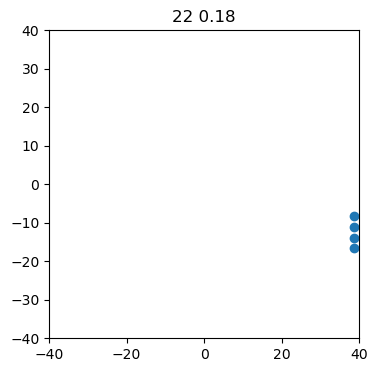

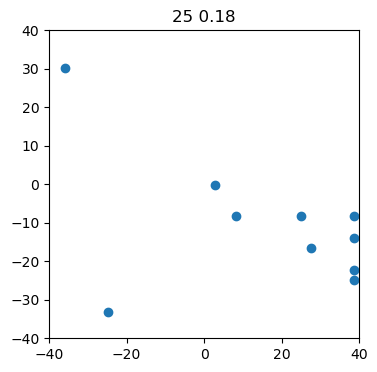

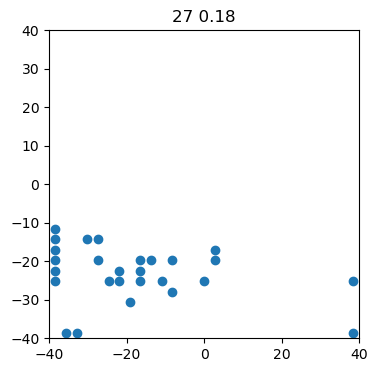

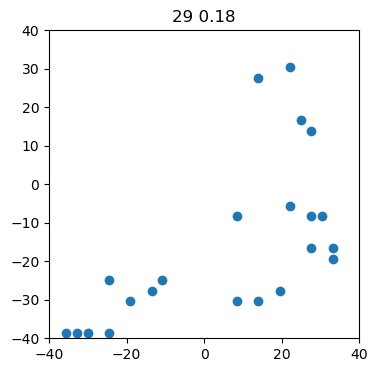

In [31]:
n_points_dict = {}
for k in dfs_divide:
    coord, coeff = heat_maps_with_coords(dfs_divide[k], bins[k], k=threses[k], tit=str(k)+' '+str(threses[k]))

##### make new neuron marks

In [32]:
threses = {14: 0.18, 16: 0.7, 22:0.18, 25:0.18, 27:0.18, 29:0.18}

In [33]:
DIR = 'neuro_preprocessed_dataset/mouse5'

In [55]:
# fname = f'{DIR}/mouse4_hm_divide.p'
# with open(fname, 'rb') as f:
#     dfs_divide = pickle.load(f)

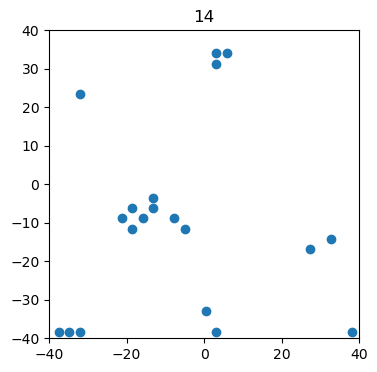

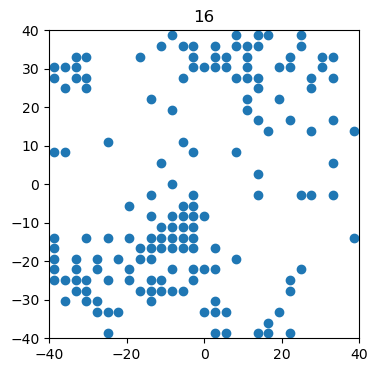

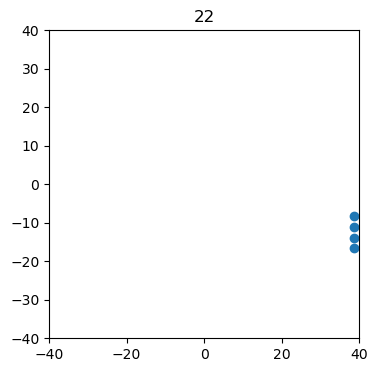

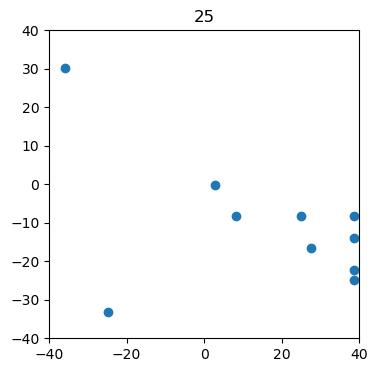

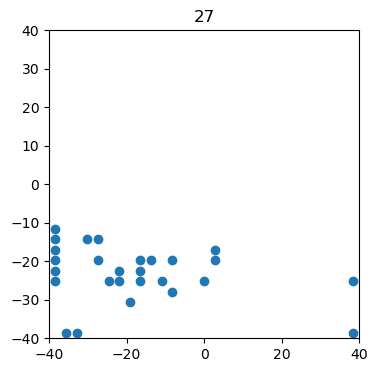

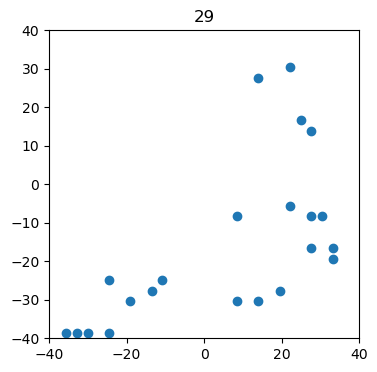

In [34]:
coords_dict = {}
coeff_dict = {}
for k in dfs_divide:
    coords_dict[k], coeff_dict[k] = heat_maps_with_coords(dfs_divide[k], bins[k], k=threses[k], tit=str(k))

### shapely part 1

#### Cluster marks and save as df

##### with bad clusters (can be skipped)

In [35]:
from utils.plotting import plot_marks_clusters
from utils.processing import cluster_marks
BINN = 30

clustered_marks_bad = {}

for k in coords_dict.keys():
    # cparams = clust_params[k]
    marks_coords = coords_dict[k] 
    mark_coeff = coeff_dict[k]   # ~ occup map
    lab = cluster_marks(marks_coords,
                    eps=6,
                    min_samples=3,
                    show=False)
    # if k==5 or k==18:
    #     lab = cluster_marks(marks_coords,
    #                     eps=6,
    #                     min_samples=2,
    #                     show=False)
    # else:
    #     lab = cluster_marks(marks_coords,
    #                     eps=6,
    #                     min_samples=3,
    #                     show=False)
    X = np.asarray(marks_coords)
    df_marks = pd.DataFrame(data={'x': X[:, 0],
                                'y': X[:, 1],
                                'coeff': mark_coeff,
                                'cluster': lab})
    #df_marks = df_marks[df_marks['cluster'] >= 0].reset_index(drop=True)
    clustered_marks_bad[k] = df_marks

14


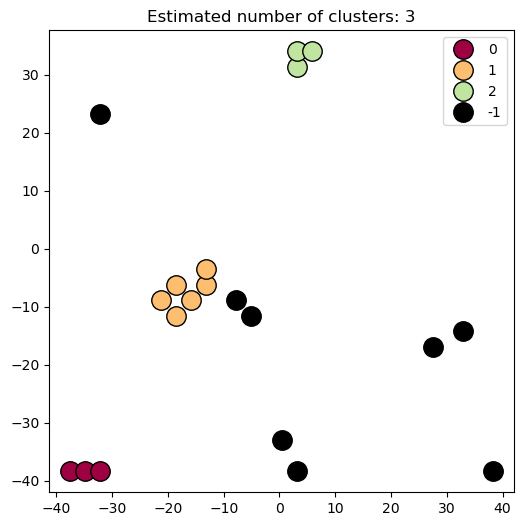

[-1  0  1  2]
16


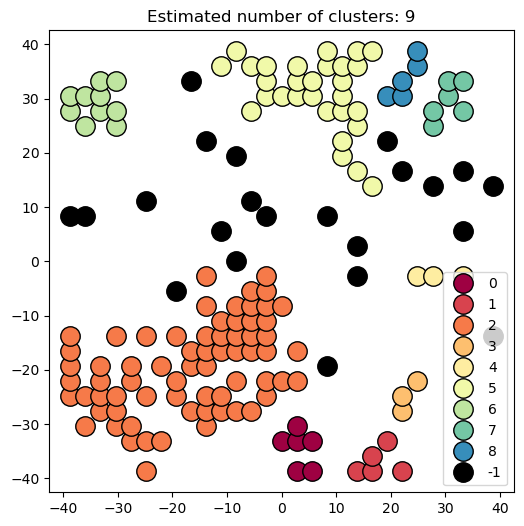

[-1  0  1  2  3  4  5  6  7  8]
22


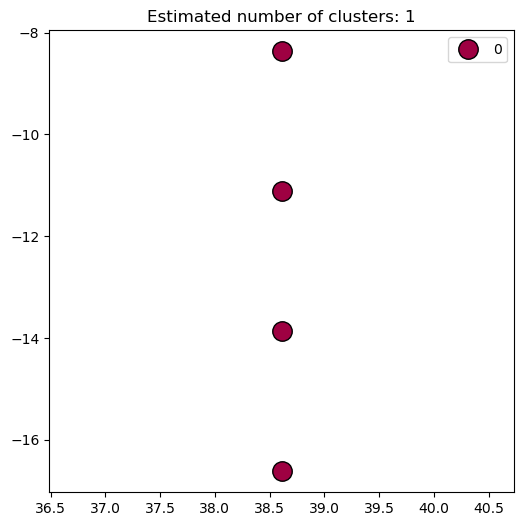

[0]
25


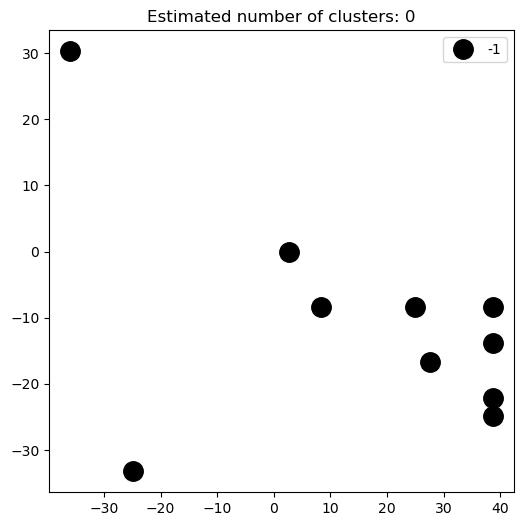

[-1]
27


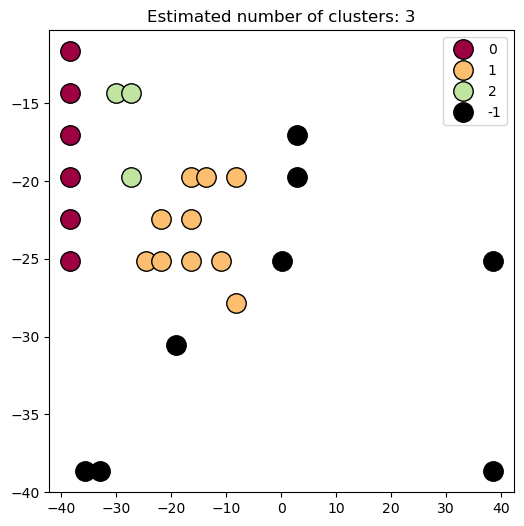

[-1  0  1  2]
29


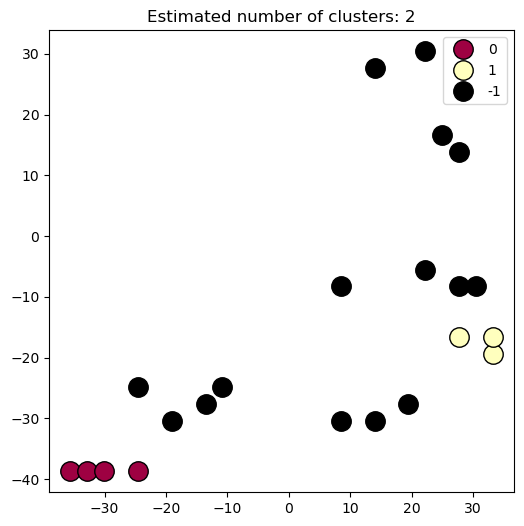

[-1  0  1]


In [36]:
for n in clustered_marks_bad:
    print(n)
    df_marks = clustered_marks_bad[n]
    X = df_marks[['x', 'y']].to_numpy()
    c = df_marks['cluster'].to_numpy()
    plot_marks_clusters(X, c)
    print(np.unique(c))

##### without bad clusters

In [37]:
del coords_dict[16]
del coords_dict[25]
del coords_dict[29]

In [38]:
from utils.plotting import plot_marks_clusters
from utils.processing import cluster_marks
BINN = 30
#SCALING = 'log'

NEURO_DIR = 'neuro_preprocessed_dataset/mouse5'
# clust_params = {
#         'tr3': {'eps': 7, 'min_samples': 1},
#         'tr5': {'eps': 5, 'min_samples': 1},
#         'tr6': {'eps': 4, 'min_samples': 1},
#         'tr7': {'eps': 7, 'min_samples': 1},
#         'tr91': {'eps': 5, 'min_samples': 3}}

clustered_marks = {}

for k in coords_dict.keys():
    # cparams = clust_params[k]
    marks_coords = coords_dict[k] 
    mark_coeff = coeff_dict[k]   # ~ occup map
    lab = cluster_marks(marks_coords,
                        eps=6,
                        min_samples=2,
                        show=False)
    # if k==5 or k==18:
    #     lab = cluster_marks(marks_coords,
    #                     eps=6,
    #                     min_samples=2,
    #                     show=False)
    # else:
    #     lab = cluster_marks(marks_coords,
    #                     eps=6,
    #                     min_samples=3,
    #                     show=False)
    X = np.asarray(marks_coords)
    df_marks = pd.DataFrame(data={'x': X[:, 0],
                                'y': X[:, 1],
                                'coeff': mark_coeff,
                                'cluster': lab})
    df_marks = df_marks[df_marks['cluster'] >= 0].reset_index(drop=True)
    clustered_marks[k] = df_marks
    
    savename = f'{NEURO_DIR}/marks_{k}_{BINN}bin.pkl'
    with open(savename, 'wb') as fp:    # NOTE: uncomment to save
        pickle.dump(df_marks, fp)

In [40]:
savename = f'{NEURO_DIR}/clustered_marks_{BINN}bin.pkl'
with open(savename, 'wb') as fp:    # NOTE: uncomment to save
    pickle.dump(clustered_marks, fp)

14


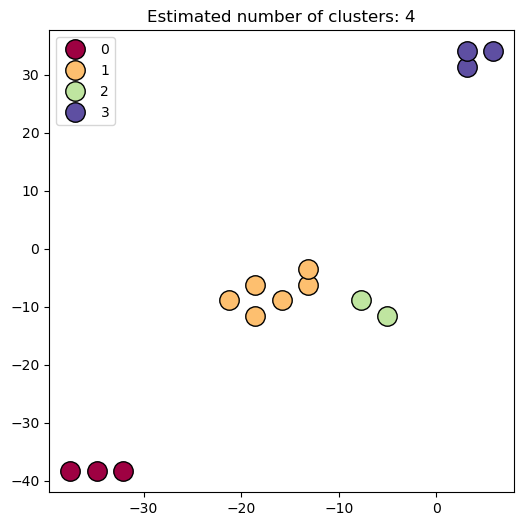

[0 1 2 3]
22


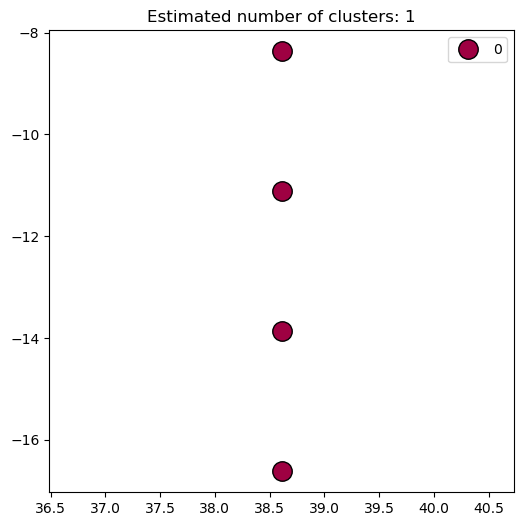

[0]
27


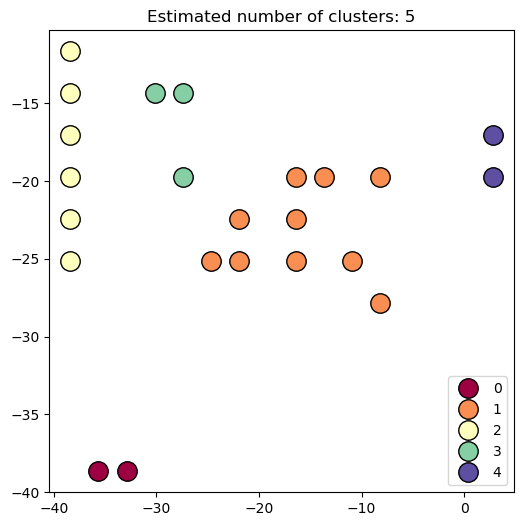

[0 1 2 3 4]


In [41]:
for n in clustered_marks:
    print(n)
    df_marks = clustered_marks[n]
    X = df_marks[['x', 'y']].to_numpy()
    c = df_marks['cluster'].to_numpy()
    plot_marks_clusters(X, c)
    print(np.unique(c))

#### Define area around marks (probably can be skipped)

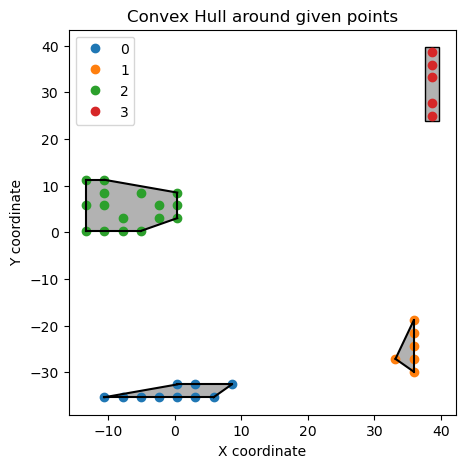

In [66]:
from scipy.spatial import ConvexHull

def plot_bound_box(points, buffer=1.0, lab=None):
    x_min, y_min = points.min(axis=0) - buffer
    x_max, y_max = points.max(axis=0) + buffer

    plt.plot(points[:, 0], points[:, 1], 'o', label=lab)
    currentAxis = plt.gca()
    currentAxis.add_patch(Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     alpha=0.3, facecolor='black'))
    currentAxis.add_patch(Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     edgecolor='black', facecolor='none'))

plt.figure(figsize=(5, 5))

#i guess
df_marks = clustered_marks[5]
#df_marks = df_marks.loc[df_marks['cluster']!=0]
X = df_marks[['x', 'y']].to_numpy()
c = df_marks['cluster'].to_numpy()
clust_labels = np.unique(c)

for lab in clust_labels:

    points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
    if (sum(points[:,0] == points[0,0]) == len(points)) or (sum(points[:,1] == points[0,1]) == len(points)):
        plot_bound_box(points, lab=lab)
        continue
    plt.plot(points[:, 0], points[:, 1], 'o', label=lab)
    
    hull = ConvexHull(points)
    for simplex in hull.simplices:
        plt.plot(points[simplex, 0], points[simplex, 1], 'k-')
    plt.fill(points[hull.vertices,0], points[hull.vertices,1], 'k', alpha=0.3)

plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
plt.title('Convex Hull around given points')
plt.legend()
plt.show()

#### Switch to shapely (не доделала после смены координат)

https://shapely.readthedocs.io/en/stable/manual.html

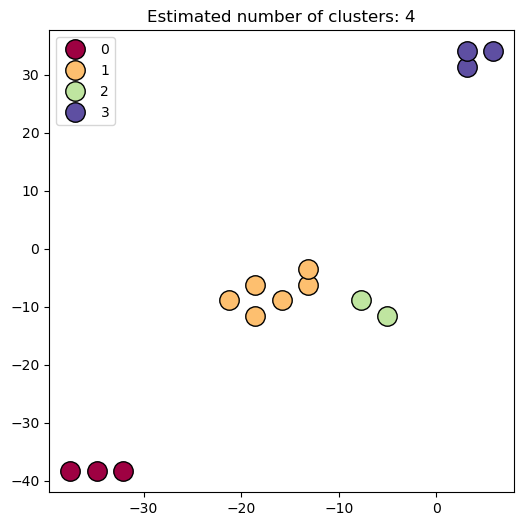

[0 1 2 3]


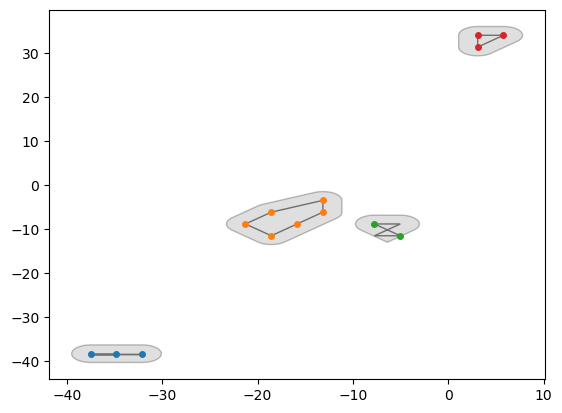

In [43]:
def marks2shapely(df_marks, clust_labels, r=2, show=True):
    """
    df_marks: df with marks for a mice. clustered
    clust_labels: unique labels of clusters
    r: buffer zone radius

    return:
    marks_poly_list: a triplet of 
    [a marker cluster polygon, buffer zone and label of a cluster]
    """
    marks_poly_list = []

    for lab in clust_labels:
        points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
        #points = [(xy[0], xy[1]) for xy in points]

        if (sum(points[:,0] == points[0,0]) == len(points) ) or (sum(points[:,1] == points[0,1]) == len(points)) or (len(points) == 2):
            point1, point2 = points[0], points[1]
            point3, point4 = (point1[0], point2[1]), (point2[0], point1[1])
            li = [a for a in points]
            li = li + [point3, point4]
            convex_hull_polygon = Polygon(li)
        else: 
            multi_point = MultiPoint(points)
            convex_hull_polygon = multi_point.convex_hull
        # Create a buffer
        zone_polygon = convex_hull_polygon.buffer(r)
        marks_poly_list.append([convex_hull_polygon, zone_polygon, lab])
        if show:
            x_zone, y_zone = zone_polygon.exterior.xy
            plt.fill(x_zone, y_zone, alpha=0.25, linewidth=1, linestyle='-',
                    edgecolor='black', facecolor='gray', label='Zone Polygon')

            x, y = convex_hull_polygon.exterior.xy
            plt.fill(x, y, alpha=0.5, linewidth=1, linestyle='-',
                    facecolor='none', edgecolor='black', label='')
            plt.plot(*zip(*points), marker='o', ls='',
                    markersize=4.)
    if show:       
        plt.show()
    
    return marks_poly_list

df_marks = clustered_marks[14]
#df_marks = df_marks.loc[df_marks['cluster']!=0]
X = df_marks[['x', 'y']].to_numpy()
c = df_marks['cluster'].to_numpy()
plot_marks_clusters(X, c)
print(np.unique(c))
clust_labels = np.unique(c)
marks_poly_list = marks2shapely(df_marks, clust_labels)

In [111]:
#dfs_divide[4].to_numpy().max()

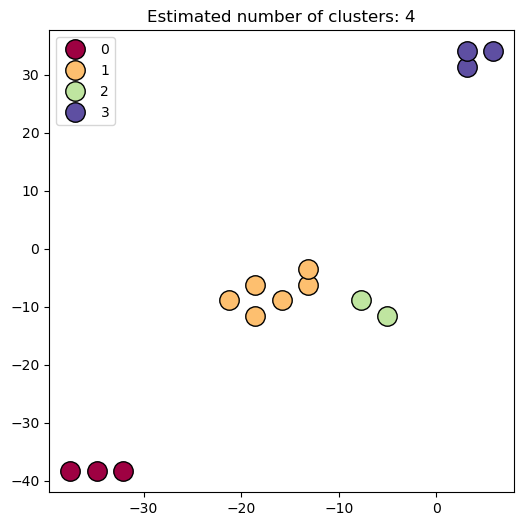

[0 1 2 3]


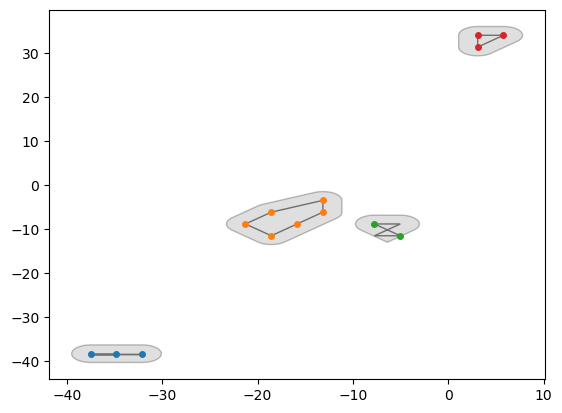

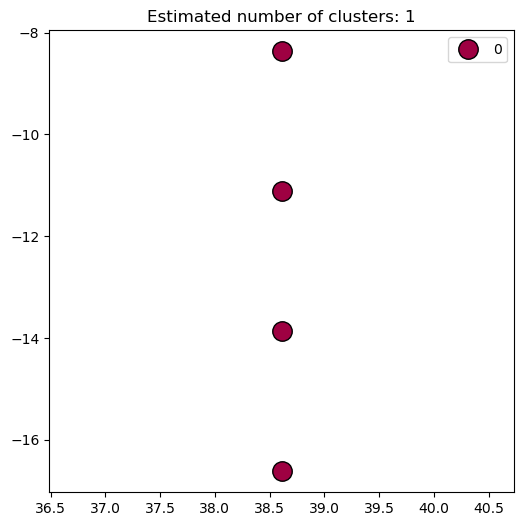

[0]


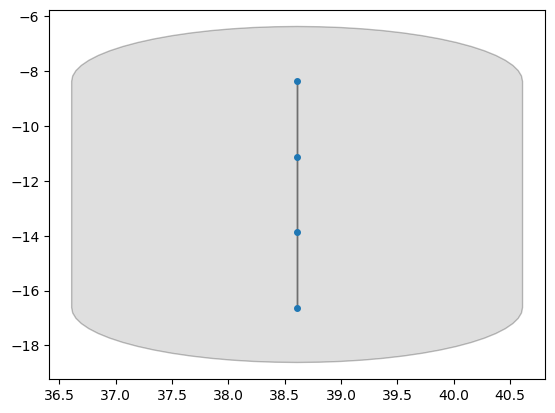

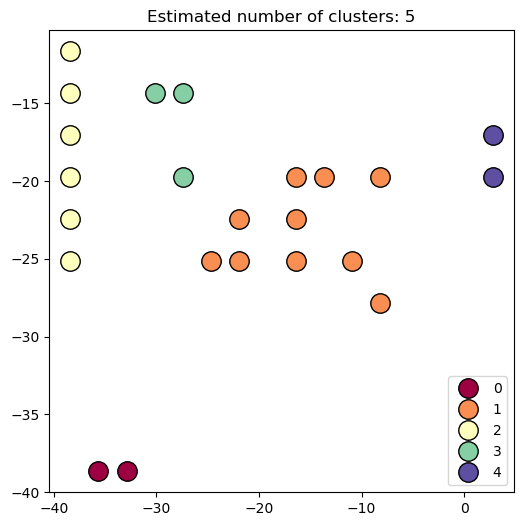

[0 1 2 3 4]


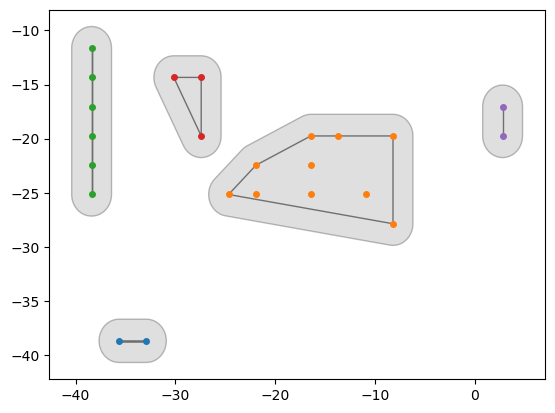

In [44]:
all_polygons = {}
for i in clustered_marks:
    df_marks = clustered_marks[i]
    X = df_marks[['x', 'y']].to_numpy()
    c = df_marks['cluster'].to_numpy()
    plot_marks_clusters(X, c)
    print(np.unique(c))
    clust_labels = np.unique(c)
    marks_poly_list = marks2shapely(df_marks, clust_labels)
    all_polygons[i] = marks_poly_list

In [73]:
clustered_marks

{5:             x          y  coeff  cluster
 0  -10.528883 -35.319350  0.484        0
 1   -7.798155 -35.319350  0.925        0
 2   -5.067427 -35.319350  0.966        0
 3   -2.336699 -35.319350  0.929        0
 4    0.394029 -35.319350  0.967        0
 5    3.124757 -35.319350  0.768        0
 6    5.855486 -35.319350  0.620        0
 7    0.394029 -32.580106  0.554        0
 8    3.124757 -32.580106  0.485        0
 9    8.586214 -32.580106  0.385        0
 10  35.893495 -29.840863  0.300        1
 11  33.162767 -27.101620  0.333        1
 12  35.893495 -27.101620  0.350        1
 13  35.893495 -24.362376  0.625        1
 14  35.893495 -21.623133  0.397        1
 15  35.893495 -18.883890  0.405        1
 16 -13.259612   0.290814  0.299        2
 17 -10.528883   0.290814  0.535        2
 18  -7.798155   0.290814  0.461        2
 19  -5.067427   0.290814  0.337        2
 20  -7.798155   3.030057  0.944        2
 21  -2.336699   3.030057  0.596        2
 22   0.394029   3.030057  0.57

In [45]:
all_polygons

{14: [[<POLYGON ((-37.524 -38.363, -34.817 -38.363, -32.109 -38.363, -37.524 -38.36...>,
   <POLYGON ((-39.524 -38.363, -39.515 -38.167, -39.486 -37.973, -39.438 -37.78...>,
   0],
  [<POLYGON ((-18.571 -11.544, -21.279 -8.862, -18.571 -6.18, -13.156 -3.498, -...>,
   <POLYGON ((-17.164 -12.965, -17.309 -13.095, -17.466 -13.211, -17.634 -13.31...>,
   1],
  [<POLYGON ((-5.033 -11.544, -7.741 -8.862, -5.033 -8.862, -7.741 -11.544, -5....>,
   <POLYGON ((-6.387 -12.859, -6.423 -12.947, -6.44 -12.965, -9.148 -10.283, -9...>,
   2],
  [<POLYGON ((3.09 31.367, 3.09 34.049, 5.798 34.049, 3.09 31.367))>,
   <POLYGON ((4.497 29.946, 4.352 29.815, 4.194 29.699, 4.025 29.599, 3.848 29....>,
   3]],
 22: [[<POLYGON ((38.61 -16.62, 38.61 -13.868, 38.61 -11.116, 38.61 -8.365, 38.61 -...>,
   <POLYGON ((40.61 -16.62, 40.6 -16.816, 40.571 -17.01, 40.524 -17.2, 40.458 -...>,
   0]],
 27: [[<POLYGON ((-35.654 -38.668, -32.907 -38.668, -35.654 -38.668, -32.907 -38.66...>,
   <POLYGON ((-37.654 -38.668, 

In [46]:
marks_poly_list[0]

[<POLYGON ((-35.654 -38.668, -32.907 -38.668, -35.654 -38.668, -32.907 -38.66...>,
 <POLYGON ((-37.654 -38.668, -37.645 -38.472, -37.616 -38.278, -37.568 -38.08...>,
 0]

### trajectory preprocessing (make for_polygons_basic)

In [146]:
# plt.plot(traj_whole['time'])

In [47]:
#1. add v
traj_whole = add_filtered_V(traj_whole)


In [48]:
#2. add angles and absolute displacements
def add_angles(df):
    dt = df['time'].diff()
    vvx = df['x'].diff() / dt 
    vvy = df['y'].diff() / dt 
    dt[0], vvx[0], vvy[0] = 0., 0., 0.

    Xx = np.arctan2(vvx, vvy)
    Nres = normalize_angles_2pi(Xx)
    ang = np.rad2deg(Nres) % 360
    df['angles'] = ang
    return df

# def add_delta_angles(df):
#     dangles = df['angles'].diff()
#     dangles[0] = 0.
#     dangles_rad = np.deg2rad(dangles)
#     normed_dangels_rad = normalize_angles_2pi(dangles_rad)
#     df['delta_angle'] = np.rad2deg(normed_dangels_rad) % 360
#     return df


def add_step_length(df):
    dx = df['x'].diff()
    dy = df['y'].diff()
    dx[0], dy[0] = 0., 0.,
    step_lens = (dx**2 + dy**2)**0.5
    df['step_length'] = step_lens
    return df

df_step = add_step_length(traj_whole)
df_ang = add_angles(df_step)



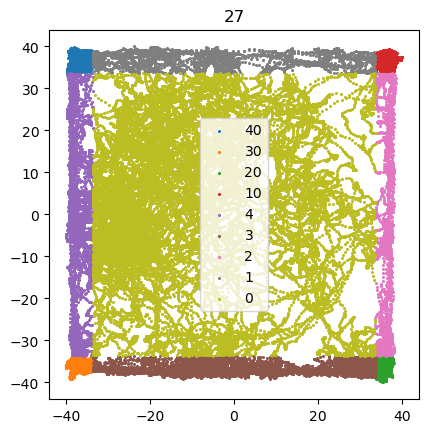

In [49]:
#3. add angles and absolute displacements
wall_perc = 0.08
def sort_walls_area(tr, border_tr, wall_percent=0.1): 
    ylen = border_tr['ymax'] - border_tr['ymin'] 
    xlen = border_tr['xmax'] - border_tr['xmin'] 
    xl = border_tr['xmin'] + xlen * wall_percent
    xr = border_tr['xmax'] - xlen * wall_percent
    yd = border_tr['ymin'] + ylen * wall_percent
    yu = border_tr['ymax'] - ylen * wall_percent

    tr['near_wall'] = 0.
    for i in range(len(tr)):     
        if tr['x'].iloc[i] < xl:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 40
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 30
            else:
                tr['near_wall'].iloc[i] = 4
        elif tr['x'].iloc[i] > xr:
            if tr['y'].iloc[i] > yu:
                tr['near_wall'].iloc[i] = 10
            elif tr['y'].iloc[i] < yd:
                tr['near_wall'].iloc[i] = 20
            else:
                tr['near_wall'].iloc[i] = 2
        elif tr['y'].iloc[i] > yu:
            tr['near_wall'].iloc[i] = 1
        elif tr['y'].iloc[i] < yd:
            tr['near_wall'].iloc[i] = 3
    return tr

def plot_wall_sorted_samples(df, plot_title):
    all_areas = [40, 30, 20, 10, 4, 3, 2, 1, 0]
    for a in all_areas:
        x = df.loc[df['near_wall'] == a]['x']
        y = df.loc[df['near_wall'] == a]['y']
        plt.scatter(x, y, s=1.5, label=str(a))
    plt.gca().set_aspect('equal')
    plt.title(plot_title)
    plt.legend(loc='center')
    plt.show()


#bord100 =  {'xmin': 0,'xmax': 100,'ymin': 0,'ymax': 100}
bord_real =  {'xmin': df_ang['x'].min(),'xmax': df_ang['x'].max(),'ymin': df_ang['y'].min(),'ymax': df_ang['y'].max()}   

df_with_walls = sort_walls_area(df_ang, bord_real, wall_perc)
plot_wall_sorted_samples(df_with_walls, k)

In [50]:
ldf = df_with_walls.iloc[1:]
#first row of ldf does not have step length
s_r = (ldf['time'].max() - ldf['time'].min())/ len(ldf)
window_size = round(0.5/s_r)
if len(ldf) >= window_size:
    ldf['step_sum_0.5'] = ldf['step_length'].rolling(window_size).sum()
    ldf['step_sum_0.5']=ldf['step_sum_0.5'].fillna(-100)
    dfs_step_sum = ldf

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_728\261054425.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ldf['step_sum_0.5'] = ldf['step_length'].rolling(window_size).sum()
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_728\261054425.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ldf['step_sum_0.5']=ldf['step_sum_0.5'].fillna(-100)


In [159]:
# df_with_walls2 = sort_walls_area(df_ang, bord100, 0.08)
# plot_wall_sorted_samples(df_with_walls2, k)

In [81]:
# df_with_walls3 = sort_walls_area(df_ang, bord100, 0.05)
# plot_wall_sorted_samples(df_with_walls3, k)

In [51]:
with open('neuro_preprocessed_dataset/mouse5/neuro_m5_for_polygons_basic.pkl', 'wb') as fp:    
    pickle.dump(dfs_step_sum, fp)

### shapely, part 2: based on marks cluster analysis

##### open preprocessed data (not edited!!)

In [94]:
DIR = 'neuro_preprocessed_dataset/mouse3'

# load traj
fname = f'{DIR}/neuro_m3_for_polygons_basic.pkl'
with open(fname, 'rb') as f:
    dfs_step_sum = pickle.load(f)

In [93]:
mname = f'{DIR}/clustered_marks_30bin.pkl'
with open(mname, 'rb') as f:
    clustered_marks = pickle.load(f)

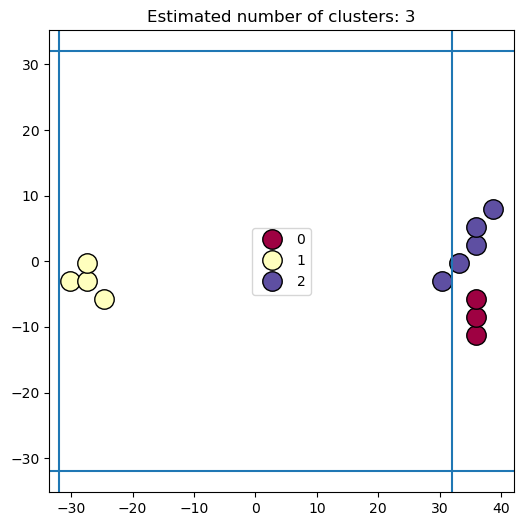

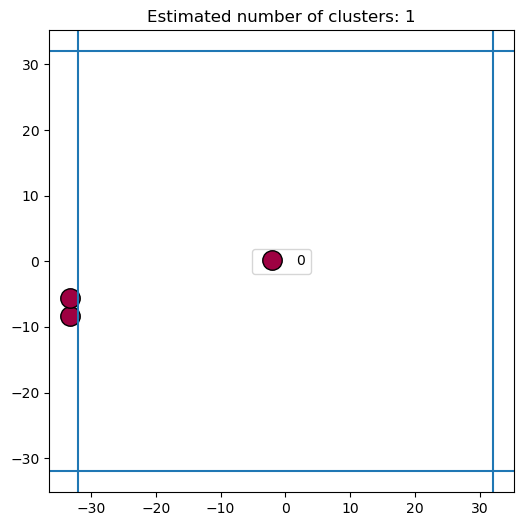

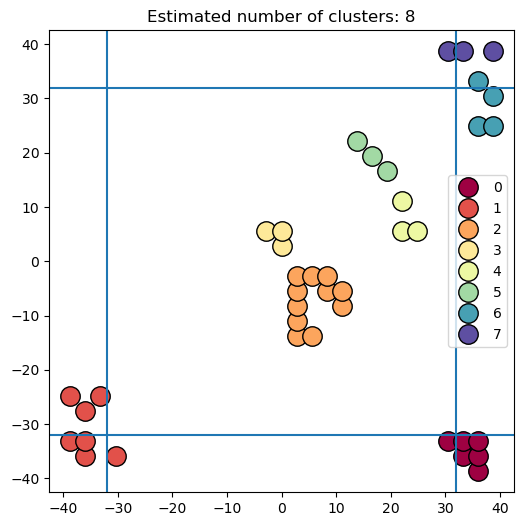

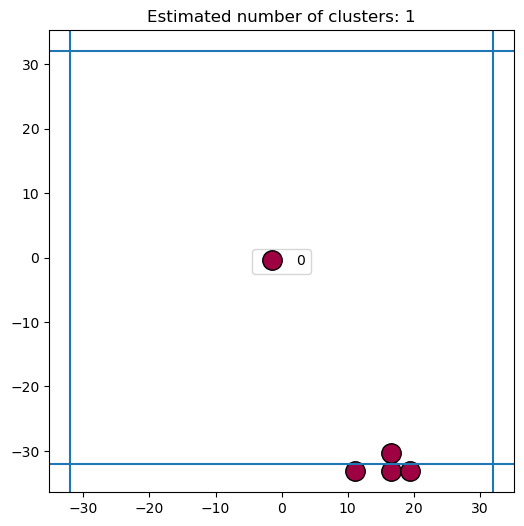

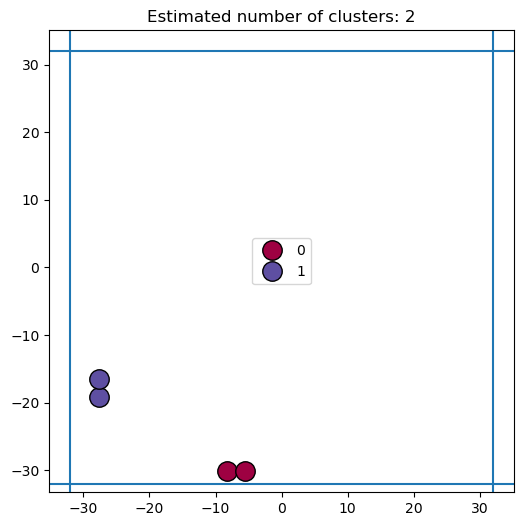

In [95]:
#can be skipped
# open marks, classify them for center, walls, corners manually
for k in clustered_marks:
    m = clustered_marks[k]
    X = m[['x', 'y']].to_numpy()
    c = m['cluster'].to_numpy()
    plot_marks_clusters(X, c, areas=True, lmin=-40, lmax=40)
#i think there is no need to fix these clusters

##### plot polygons, compute kappa

In [52]:



# def marks2shapely(df_marks, clust_labels, r=2, show=True):
#     """
#     df_marks: df with marks for a mice. clustered
#     clust_labels: unique labels of clusters
#     r: buffer zone radius

#     return:
#     marks_poly_list: a triplet of 
#     [a marker cluster polygon, buffer zone and label of a cluster]
#     """
#     marks_poly_list = []
#     # cmap = matplotlib.cm.get_cmap('tab20')
#     cmap = matplotlib.cm.get_cmap('tab20')
#     colors = cmap(clust_labels)

#     for idx, lab in enumerate(clust_labels):
#         points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
#         points = [(xy[0], xy[1]) for xy in points]

#         if len(points) == 2:
#             point1, point2 = points[0], points[1]
#             point3, point4 = (point1[0], point2[1]), (point2[0], point1[1])
#             convex_hull_polygon = Polygon([point1, point3,
#                                            point2, point4])
#         elif len(points) == 1:
#             convex_hull_polygon = Point(points)
#         else: 
#             multi_point = MultiPoint(points)
#             convex_hull_polygon = multi_point.convex_hull
            
#         # Create a buffer
#         zone_polygon = convex_hull_polygon.buffer(r)
#         marks_poly_list.append([convex_hull_polygon, zone_polygon, lab])
#         if show:
#             x_zone, y_zone = zone_polygon.exterior.xy
#             plt.fill(x_zone, y_zone, alpha=0.75, linewidth=1, linestyle='-',
#                     edgecolor='black', label=lab, color=colors[idx])
            
#             if type(convex_hull_polygon) == LineString:
#                 coord = shapely.get_coordinates(convex_hull_polygon)
#                 x, y = coord[:, 0], coord[:, 1]
#             elif type(convex_hull_polygon) == Point:
#                 x, y = convex_hull_polygon.x, convex_hull_polygon.y
#             else:
#                 x, y = convex_hull_polygon.exterior.xy

#             plt.fill(x, y, alpha=0.5, linewidth=1, linestyle='-',
#                     facecolor='none', edgecolor='black', label='')
            
#     # color the points wrt mark strength
#     x_, y_ = df_marks['x'], df_marks['y']
#     color = df_marks['coeff'].to_numpy()
#     plt.scatter(x_, y_, c=color, cmap='Greys', s=22)
#     plt.colorbar()
#     plt.legend()
#     for vline in [-40, 40]:
#         plt.axvline(vline, alpha=0.35, zorder=0, color='grey')     
#         plt.axhline(vline, alpha=0.35, zorder=0, color='grey')     
#     plt.show()
    
#     return marks_poly_list


def marks2shapely_upd(df_marks, clust_labels, r=2, show=True):
    """
    df_marks: df with marks for a mice. clustered
    clust_labels: unique labels of clusters
    r: buffer zone radius

    return:
    marks_poly_list: a triplet of 
    [a marker cluster polygon, buffer zone and label of a cluster]
    """
    marks_poly_list = []

    for lab in clust_labels:
        points = df_marks[['x', 'y']].loc[df_marks['cluster']==lab].to_numpy()
        #points = [(xy[0], xy[1]) for xy in points]

        if (sum(points[:,0] == points[0,0]) == len(points) ) or (sum(points[:,1] == points[0,1]) == len(points)) or (len(points) == 2):
            point1, point2 = points[0], points[1]
            point3, point4 = (point1[0], point2[1]), (point2[0], point1[1])
            li = [a for a in points]
            li = li + [point3, point4]
            convex_hull_polygon = Polygon(li)
        else: 
            multi_point = MultiPoint(points)
            convex_hull_polygon = multi_point.convex_hull
        # Create a buffer
        zone_polygon = convex_hull_polygon.buffer(r)
        marks_poly_list.append([convex_hull_polygon, zone_polygon, lab])
        if show:
            x_zone, y_zone = zone_polygon.exterior.xy
            plt.fill(x_zone, y_zone, alpha=0.25, linewidth=1, linestyle='-',
                    edgecolor='black', facecolor='gray', label='Zone Polygon')

            x, y = convex_hull_polygon.exterior.xy
            plt.fill(x, y, alpha=0.5, linewidth=1, linestyle='-',
                    facecolor='none', edgecolor='black', label='')
            plt.plot(*zip(*points), marker='o', ls='',
                    markersize=4.)
    if show:       
        plt.show()
    
    return marks_poly_list

14 (14, 4)


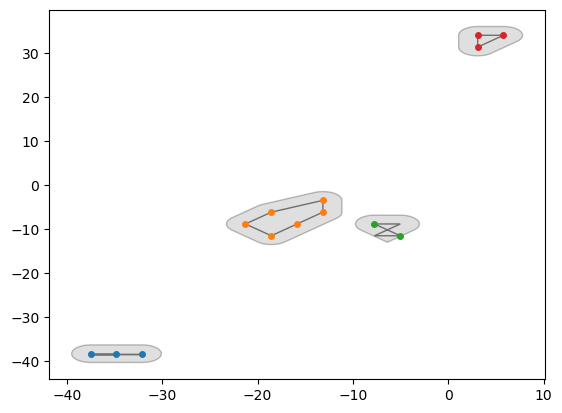

22 (4, 4)


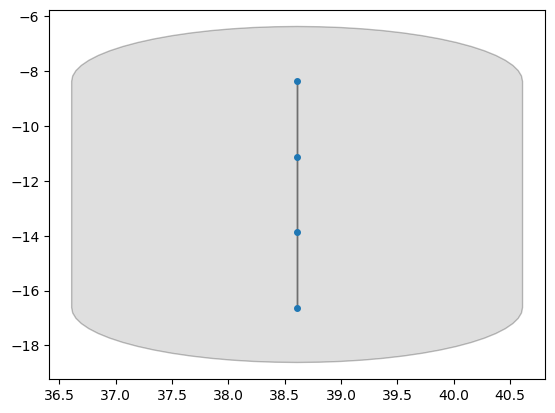

27 (23, 4)


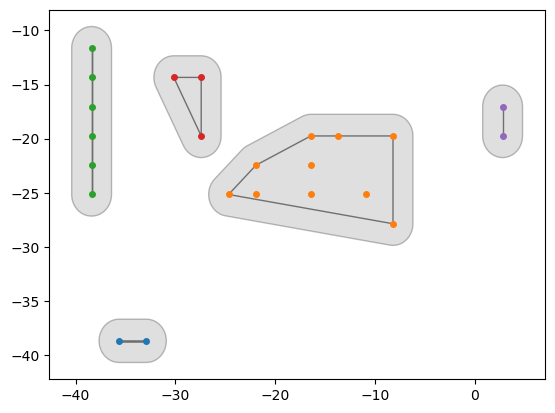

In [55]:
#same as my variable all_polygons
marks_poly_df = {}
for k, df in clustered_marks.items():
    print(k, df.shape)
    c = np.unique(df['cluster'].to_numpy())
    mpoly = marks2shapely_upd(df, c, show=True)
    marks_poly_df[k] = mpoly

5 (37, 4)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17632\3636374511.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('tab20')


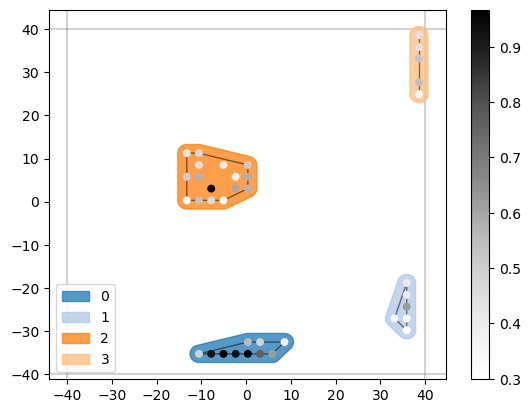

8 (21, 4)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17632\3636374511.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('tab20')


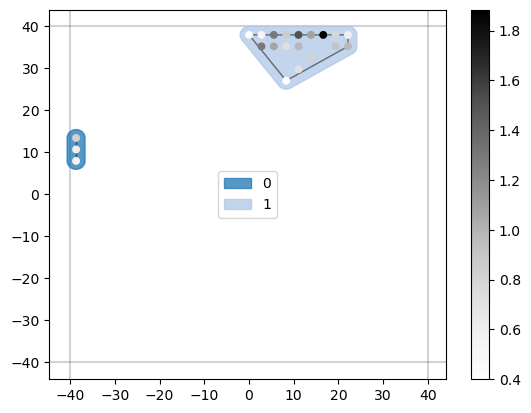

9 (24, 4)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17632\3636374511.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('tab20')


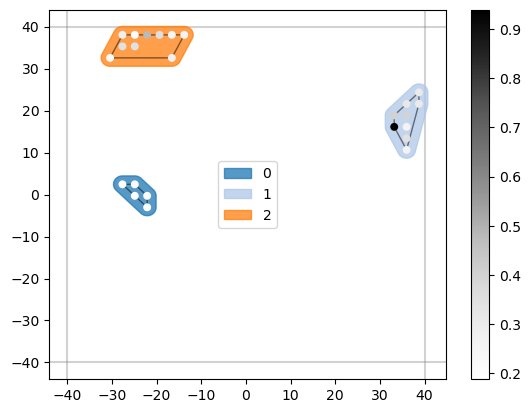

10 (49, 4)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17632\3636374511.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('tab20')


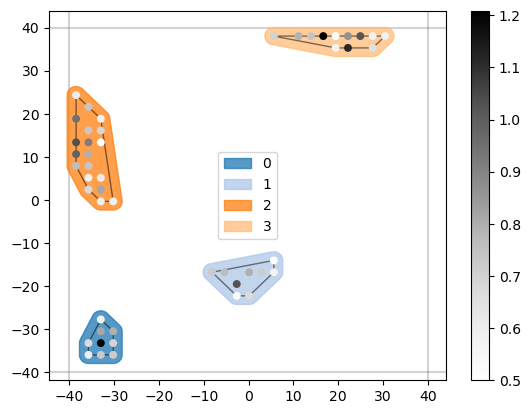

16 (24, 4)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17632\3636374511.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('tab20')


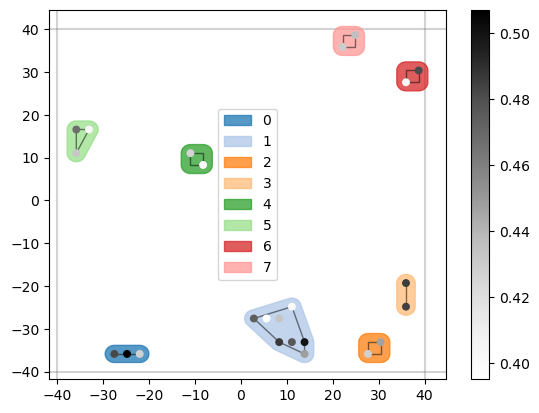

18 (9, 4)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17632\3636374511.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('tab20')


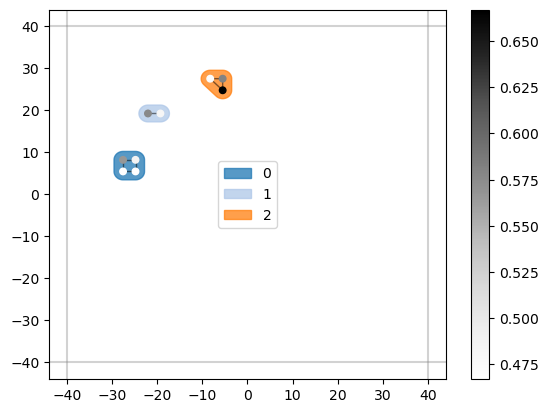

In [109]:
# #same as my variable all_polygons
# marks_poly_df = {}
# for k, df in clustered_marks.items():
#     print(k, df.shape)
#     c = np.unique(df['cluster'].to_numpy())
#     mpoly = marks2shapely(df, c, show=True)
#     marks_poly_df[k] = mpoly

In [56]:
# Manually make polygons without marks for comparison
from utils.shapely_funcs import plot_shapely_mark, plot_shapely_traj

# Create affinity transform function
def move(poly, xmove, ymove): ### TODO:
    if type(poly) == LineString:
        coord = shapely.get_coordinates(poly)
    elif type(poly) == Point:
        coord = np.array([poly.x, poly.y])
    else:
        coord = np.asarray(poly.exterior.xy)

    xm, ym = coord[0, :] + xmove, coord[1, :] + ymove
    if (any(xm > 40) | any(xm < -40)) | (any(ym > 40) | any(ym < -40)):
        raise ValueError('Out of bounds, should be in range [-40, 40]')

    coordm = Polygon(np.stack([xm, ym]).T)
    return coordm


def vflip(poly):
    if type(poly) == LineString:
        coord = shapely.get_coordinates(poly)
    elif type(poly) == Point:
        coord = np.array([poly.x, poly.y])
    else:
        coord = np.asarray(poly.exterior.xy)

    if coord.shape[1] == 1:
        poly_f = Point(coord)
    elif coord.shape[1] == 2:
        poly_f = LineString(coord)
    else:
        coord = np.asarray(coord).T
        poly_f = Polygon(coord.dot([[1,0],[0,-1]]))
    return poly_f


def hflip(poly):
    if type(poly) == LineString:
        coord = shapely.get_coordinates(poly)
    elif type(poly) == Point:
        coord = np.array([poly.x, poly.y])
    else:
        coord = np.asarray(poly.exterior.xy)

    if coord.shape[1] == 1:
        poly_f = Point(coord)
    elif coord.shape[1] == 2:
        poly_f = LineString(coord)
    else:
        coord = np.asarray(coord).T
        poly_f = Polygon(coord.dot([[-1,0],[0,1]]))
    return poly_f


def to_shapely_traj(traj_df):
    points = traj_df[['x', 'y']].to_numpy()
    trajectory_points = [(xy[0], xy[1]) for xy in points]
    trajectory = LineString(trajectory_points)
    return trajectory


r = 2

In [59]:
### Calculate coeff of strength of marks: 
# kappa_square = sum / square: the density of mark 
# kappa = sum / N_points:      the strength of mark

marks_coeffs = {}
for k, df in clustered_marks.items():
    kappas_dict = {}

    clust_labels = np.unique(df['cluster'].to_numpy())
    for idx, lab in enumerate(clust_labels):
        coeffs = df[['coeff']].loc[df['cluster']==lab].to_numpy()

        kappa = np.sum(coeffs) / coeffs.shape[0]
        
        poly_list = marks_poly_df[k]
        for l in poly_list:
            if l[2] == lab:
                sqrt = l[0].area
                if sqrt == 0:
                    kappa_square = None
                else:
                    kappa_square = np.sum(coeffs) / sqrt

        kappas_dict[lab] = [kappa, kappa_square]
    marks_coeffs[k] = kappas_dict

marks_coeffs[14]

{0: [2.291, None],
 1: [0.8646666666666666, 0.17861073862550395],
 2: [0.734, None],
 3: [0.9279999999999999, 0.7667730089952253]}

##### Now lets manually create pairs we want to compare for a trajectory¶

###### cutting a suspiciously even part of trajectory (not edited)

(1800.0, 1920.0)

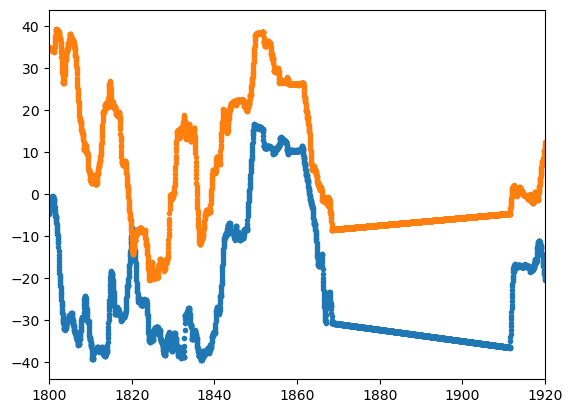

In [224]:
#cutting a suspiciously even part of trajectory

plt.plot(dfs_step_sum['time'],dfs_step_sum['x'], '.')
plt.plot(dfs_step_sum['time'],dfs_step_sum['y'],'.')
plt.xlim(1800, 1920)

(1868.0, 1912.0)

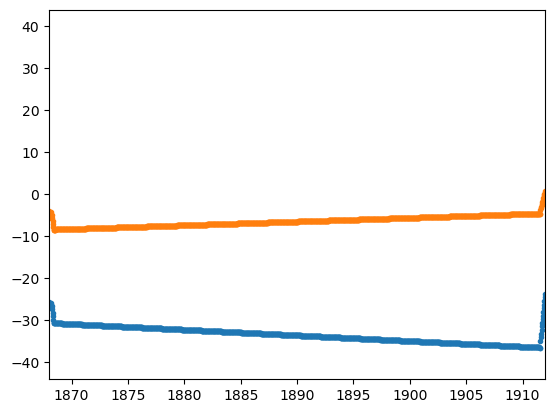

In [225]:
#cutting a suspiciously even part of trajectory

plt.plot(dfs_step_sum['time'],dfs_step_sum['x'], '.')
plt.plot(dfs_step_sum['time'],dfs_step_sum['y'],'.')
plt.xlim(1868, 1912)

In [227]:
dfs_step_sum_cut = dfs_step_sum.loc[(dfs_step_sum['time']<=1868) | (dfs_step_sum['time']>=1912)]

(1800.0, 1920.0)

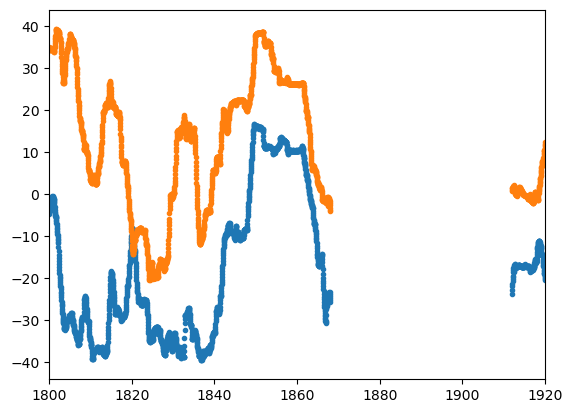

In [230]:
plt.plot(dfs_step_sum_cut['time'],dfs_step_sum_cut['x'], '.')
plt.plot(dfs_step_sum_cut['time'],dfs_step_sum_cut['y'],'.')
plt.xlim(1800, 1920)

##### make dict

In [60]:
dict_compar_lists = {}

In [61]:
marks_coeffs.keys()

dict_keys([14, 22, 27])

In [62]:
dfs_step_sum_cut = dfs_step_sum

###### 14---------------------------------------------------------------------------------------------------------------------

14
4


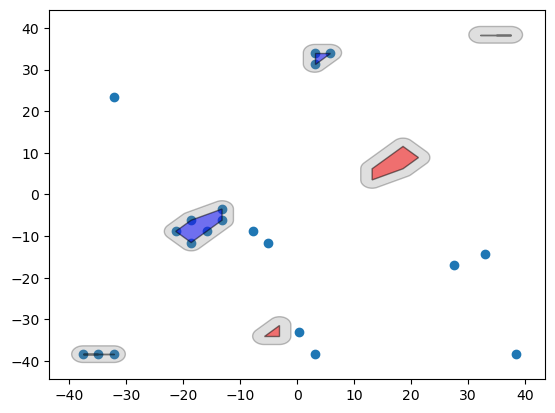

In [114]:
#1. create and plot flipped polygons

r = 2
comparison_list = []

k = 14
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y)

#0 polygon - flipped пересекается с 2
poly, buffer, lab = poly_list[0]
poly_f = vflip(hflip(poly))
buffer_f = vflip(hflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 140],
                        [poly_f, buffer_f, 14011]])


# #1 polygon
poly, buffer, lab = poly_list[1]
poly_f = vflip(hflip(poly))
buffer_f = vflip(hflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
                label='flipped', color='red')
comparison_list.append([[poly, buffer, 141],
                        [poly_f, buffer_f, 14111]])

# # #2 polygon - ошибка топологии
# poly, buffer, lab = poly_list[2]
# poly_f = hflip(vflip(poly))
# buffer_f = hflip(vflip(buffer))
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                 label='flipped', color='red')
# comparison_list.append([[poly, buffer, 142],
#                         [poly_f, buffer_f, 14211]])

# #3 polygon - такой себе флип
poly, buffer, lab = poly_list[3]
poly_f = hflip(vflip(poly))
buffer_f = hflip(vflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
                label='flipped', color='red')
comparison_list.append([[poly, buffer, 143],
                        [poly_f, buffer_f, 14311]])


dict_compar_lists[k] = comparison_list

In [73]:
big_dict_inter = {}
big_dict_buff = {}

In [113]:
comparison_list[0]

[[<POLYGON ((-37.524 -38.363, -34.817 -38.363, -32.109 -38.363, -37.524 -38.36...>,
  <POLYGON ((-39.524 -38.363, -39.515 -38.167, -39.486 -37.973, -39.438 -37.78...>,
  140],
 [<POLYGON ((37.524 38.363, 34.817 38.363, 32.109 38.363, 37.524 38.363, 34.81...>,
  <POLYGON ((39.524 38.363, 39.515 38.167, 39.486 37.973, 39.438 37.782, 39.37...>,
  14011]]

14
4


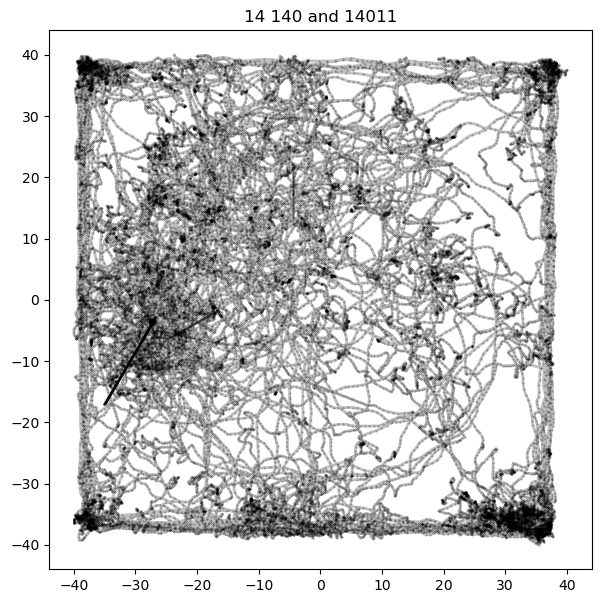

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


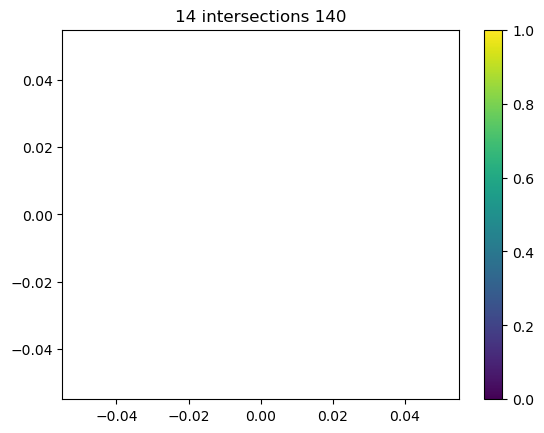

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


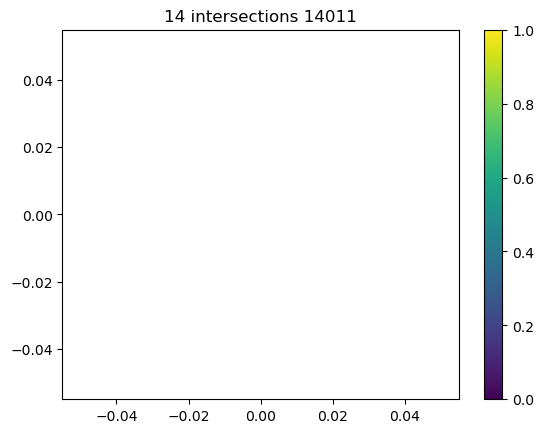

Unique intersecting points in DataFrame: 461
Total ratio: 0.008


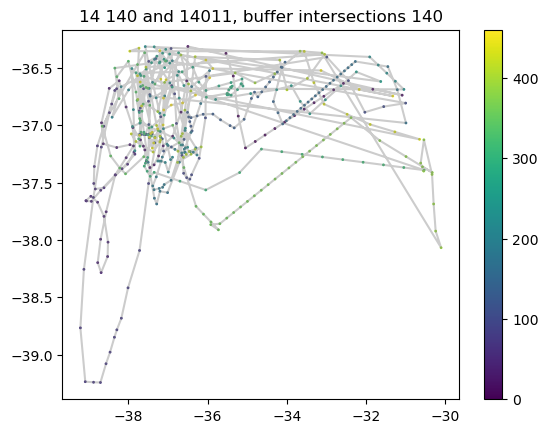

Unique intersecting points in DataFrame: 1004
Total ratio: 0.018


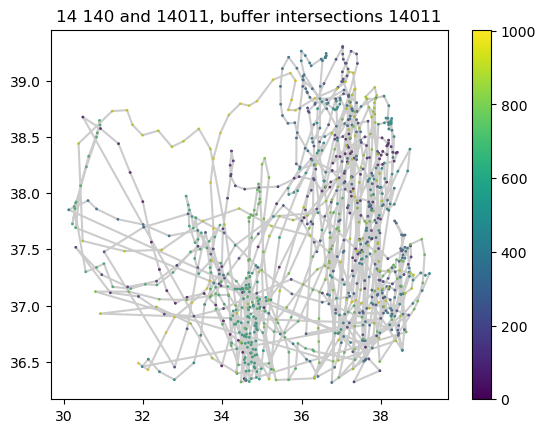

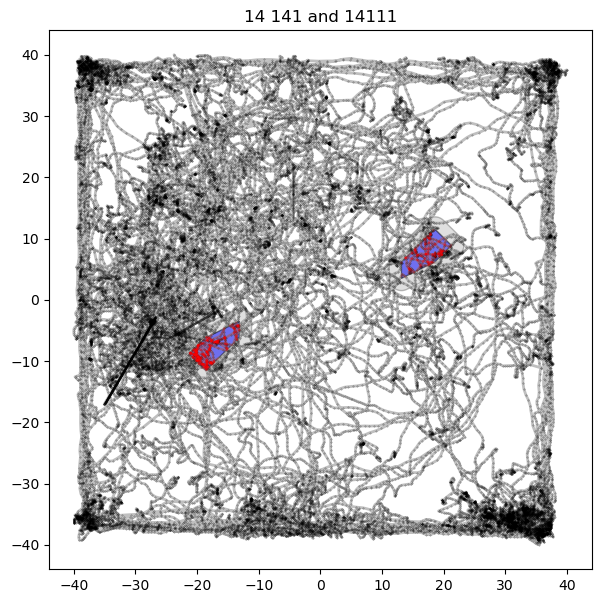

Unique intersecting points in DataFrame: 281
Total ratio: 0.005


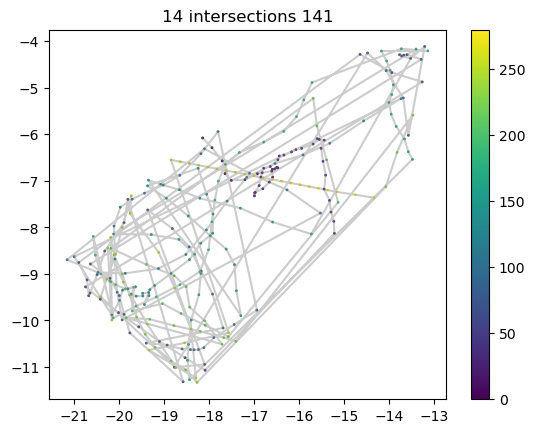

Unique intersecting points in DataFrame: 239
Total ratio: 0.004


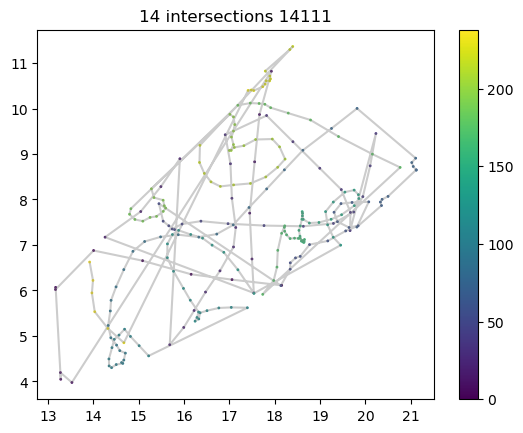

Unique intersecting points in DataFrame: 884
Total ratio: 0.016


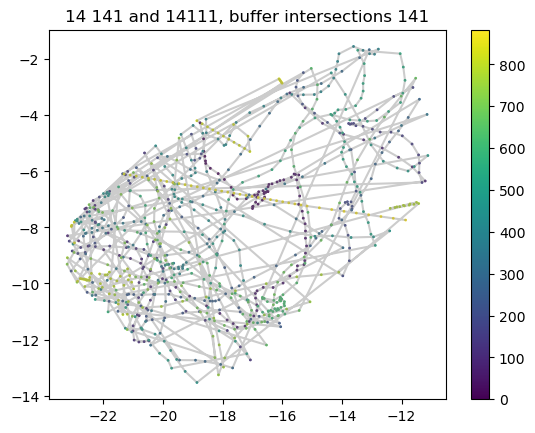

Unique intersecting points in DataFrame: 830
Total ratio: 0.015


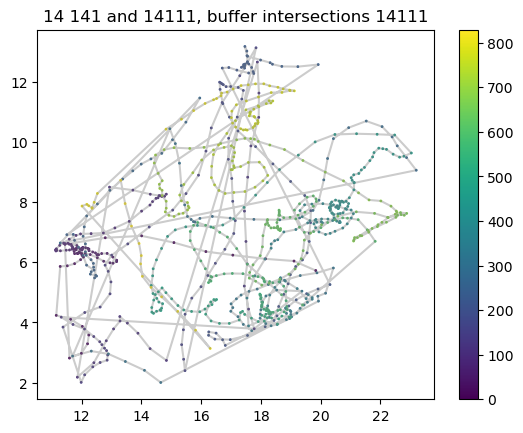

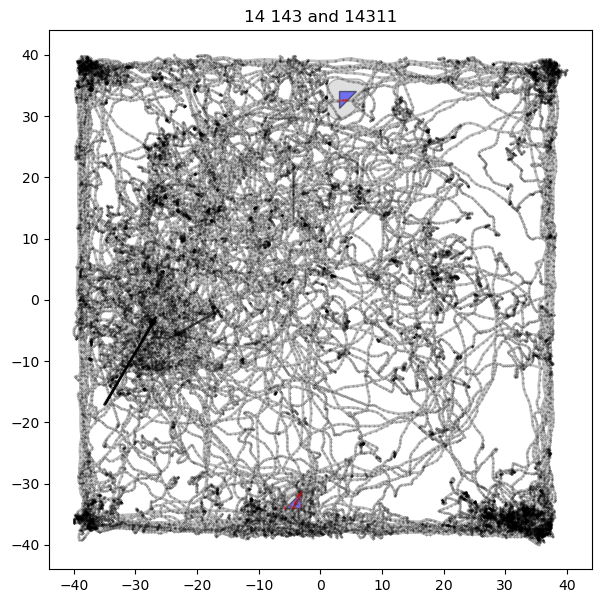

Unique intersecting points in DataFrame: 2
Total ratio: 0.0


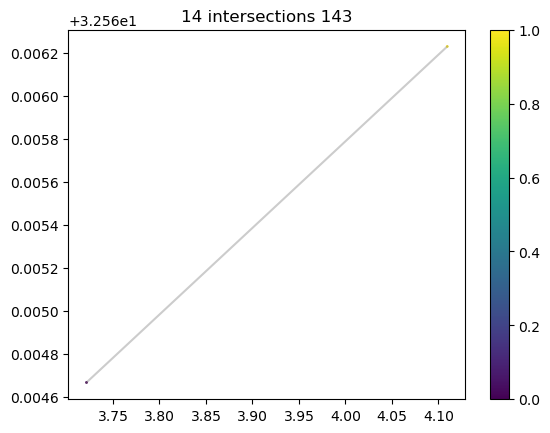

Unique intersecting points in DataFrame: 37
Total ratio: 0.001


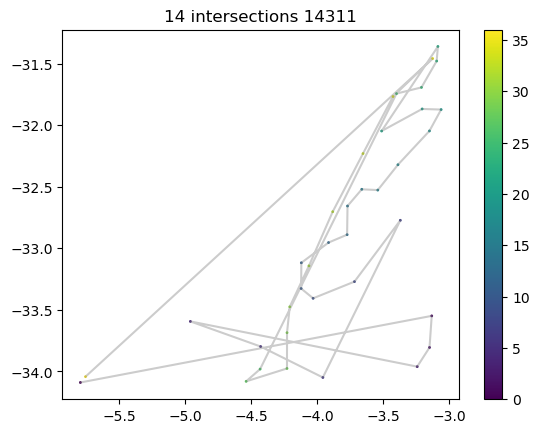

Unique intersecting points in DataFrame: 68
Total ratio: 0.001


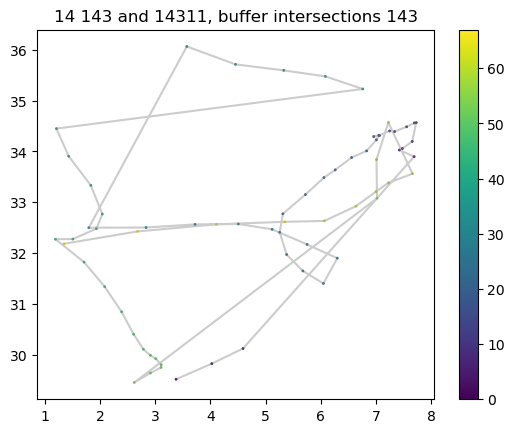

Unique intersecting points in DataFrame: 582
Total ratio: 0.01


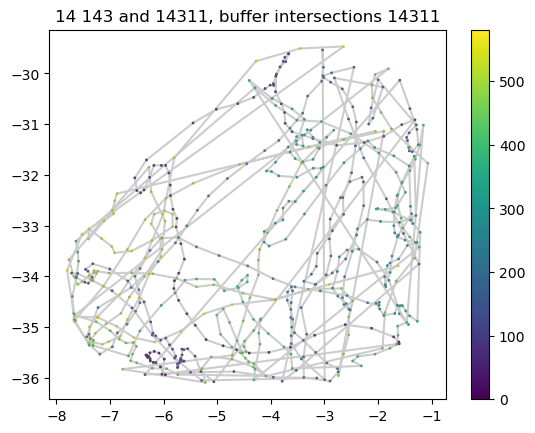

In [115]:
#2. find intersections with polygons, polygon buffers

r = 2

# k=8
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


In [116]:
big_dict_inter.keys()

dict_keys([22, 27, 14])

In [75]:
marks_poly_df.keys()

dict_keys([14, 22, 27])

###### 22---------------------------------------------------------------------------------------------------------------------

22
1


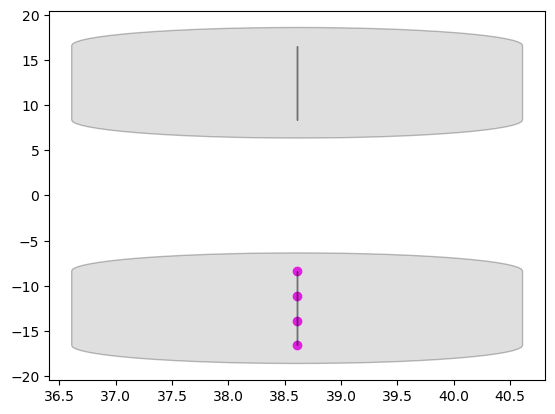

In [78]:
comparison_list = []

k = 22
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y, c='magenta')

#0 polygon
poly, buffer, lab = poly_list[0]
poly_f = vflip(poly)
buffer_f = vflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 220],
                        [poly_f, buffer_f, 22011]])

# #1 polygon
# poly, buffer, lab = poly_list[1]
# poly_f = hflip(vflip(poly))
# buffer_f = hflip(vflip(buffer))
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 51],
#                         [poly_f, buffer_f, 5111]])

# #2 polygon
# poly, buffer, lab = poly_list[2]
# poly_f = hflip(vflip(poly))
# buffer_f = hflip(vflip(buffer))
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 52],
#                         [poly_f, buffer_f, 5211]])

# #3 polygon
# poly, buffer, lab = poly_list[3]
# poly_f = hflip(vflip(poly))
# buffer_f = hflip(vflip(buffer))
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 53],
#                         [poly_f, buffer_f, 5311]])




# dict_compar_lists[k] = comparison_list

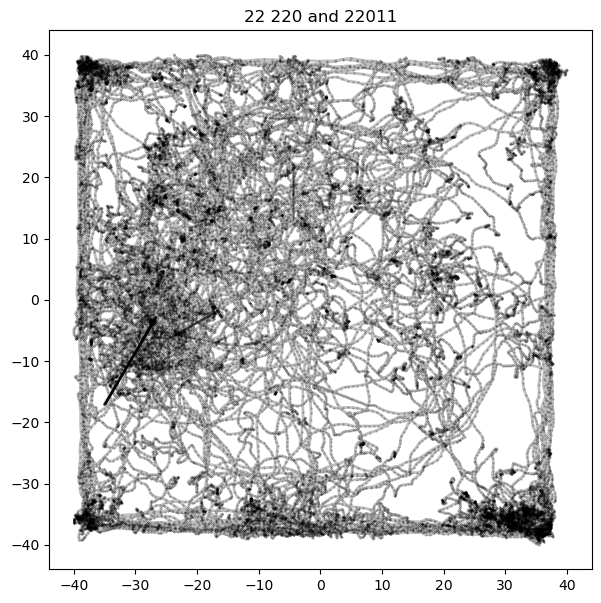

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


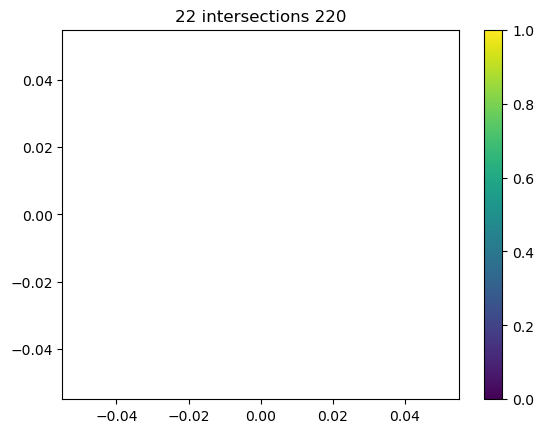

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


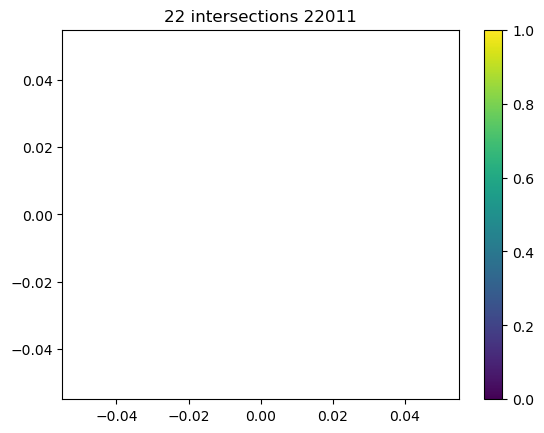

Unique intersecting points in DataFrame: 181
Total ratio: 0.003


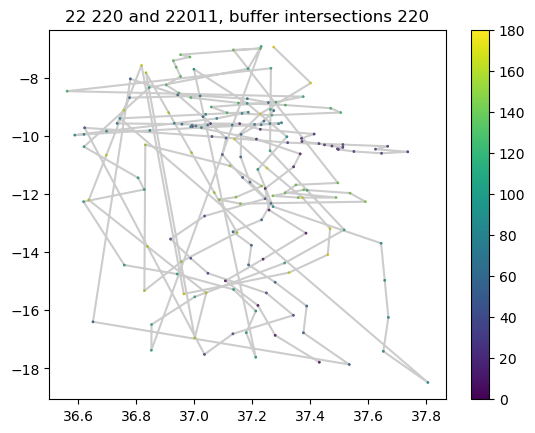

Unique intersecting points in DataFrame: 228
Total ratio: 0.004


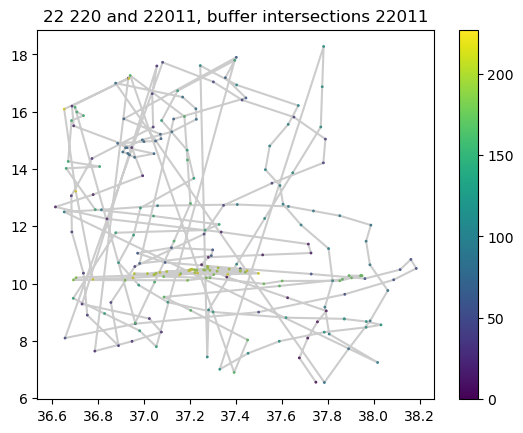

In [79]:
#2. find intersections with polygons, polygon buffers

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


In [80]:
# plt.plot(tr_new.loc[tr_new_buff['intersection']==50]['time'],tr_new.loc[tr_new_buff['intersection']==50]['x'], '.')
# plt.plot(tr_new.loc[tr_new_buff['intersection']==50]['time'],tr_new.loc[tr_new_buff['intersection']==50]['y'],'.')

In [81]:
# plt.plot(dfs_step_sum['time'],dfs_step_sum['x'], '.')
# plt.plot(dfs_step_sum['time'],dfs_step_sum['y'],'.')

###### 27---------------------------------------------------------------------------------------------------------------------

27
5


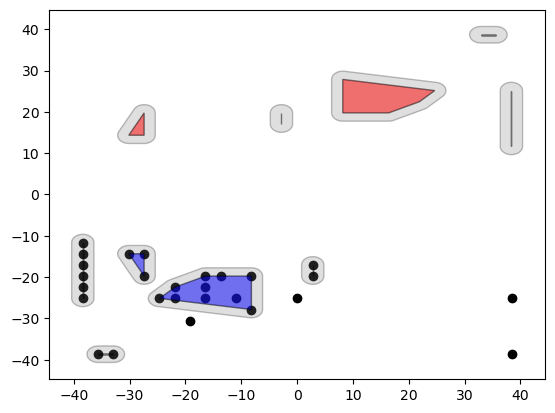

In [97]:
comparison_list = []

k = 27
poly_list = marks_poly_df[k]
print(k)
print(len(poly_list))  # [poly, buffer, lab]

traj = dfs_step_sum_cut
#plot_shapely_traj(to_shapely_traj(traj))

trN_coords = coords_dict[k]
trN_coords_x = [i[0] for i in trN_coords]
trN_coords_y = [i[1] for i in trN_coords]
plt.scatter(trN_coords_x, trN_coords_y, color='black')

#0 polygon - flipped пересекается с точкой
poly, buffer, lab = poly_list[0]
poly_f = vflip(hflip(poly))
buffer_f = vflip(hflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 270],
                        [poly_f, buffer_f, 27011]])

#1 polygon -  не с чем сравнивать
poly, buffer, lab = poly_list[1]
poly_f = hflip(vflip(poly))
buffer_f = hflip(vflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 271],
                        [poly_f, buffer_f, 27111]])

#2 polygon
poly, buffer, lab = poly_list[2]
poly_f = vflip(hflip(poly))
buffer_f = vflip(hflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 272],
                        [poly_f, buffer_f, 27211]])

#3 polygon 
poly, buffer, lab = poly_list[3]
poly_f = vflip(poly)
buffer_f = vflip(buffer)
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 273],
                        [poly_f, buffer_f, 27311]])

# # #4 polygon
poly, buffer, lab = poly_list[4]
poly_f = hflip(vflip(poly))
buffer_f = hflip(vflip(buffer))
plot_shapely_mark(poly, buffer)
plot_shapely_mark(poly_f, buffer_f,
               label='flipped', color='red')
comparison_list.append([[poly, buffer, 274],
                        [poly_f, buffer_f, 27411]])




dict_compar_lists[k] = comparison_list

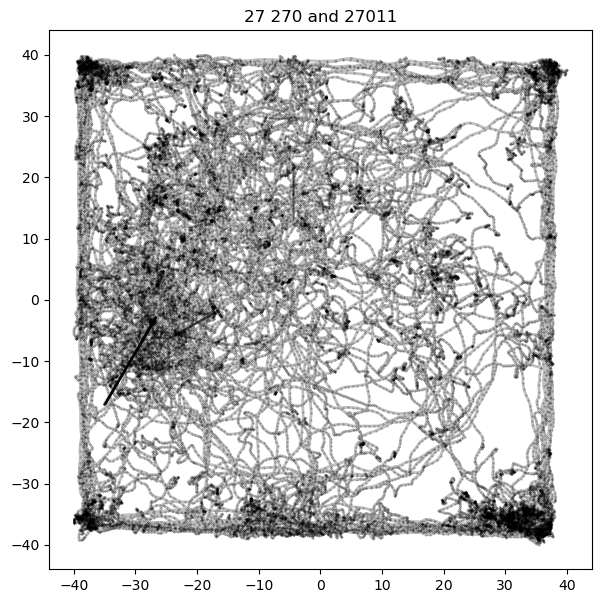

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


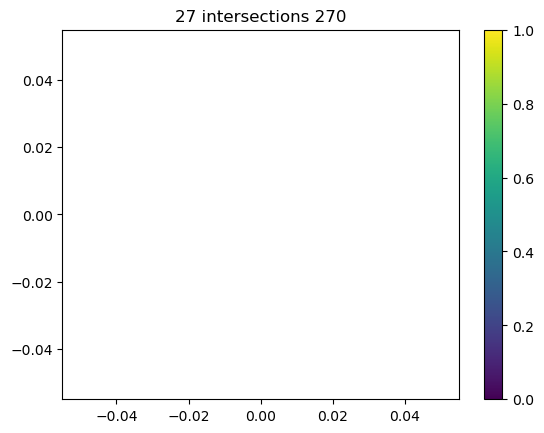

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


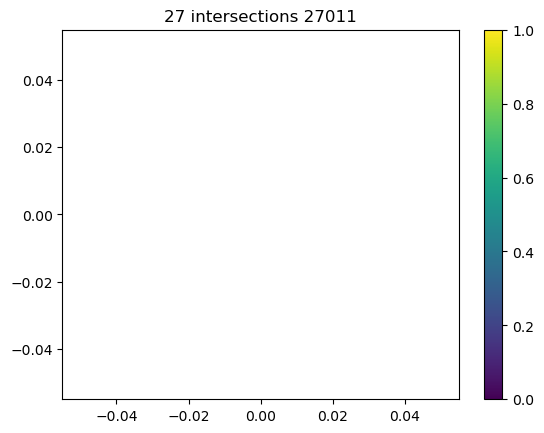

Unique intersecting points in DataFrame: 167
Total ratio: 0.003


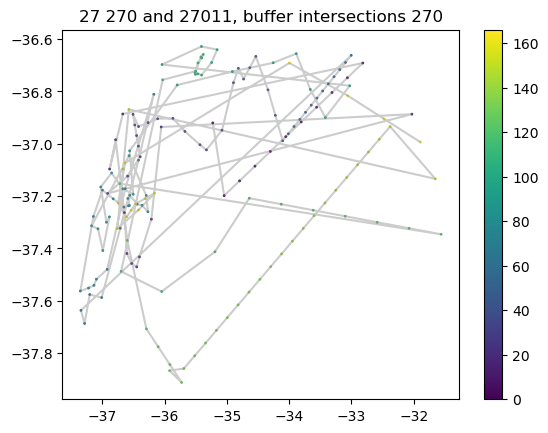

Unique intersecting points in DataFrame: 581
Total ratio: 0.01


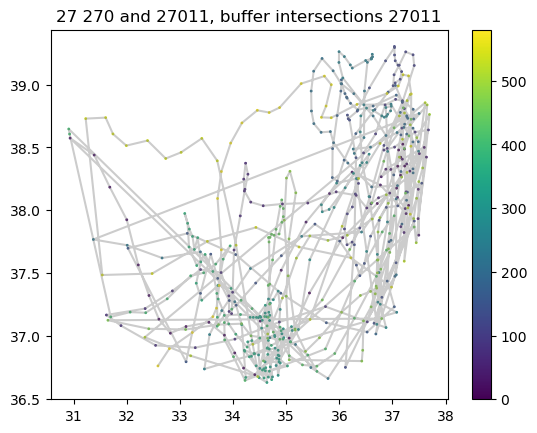

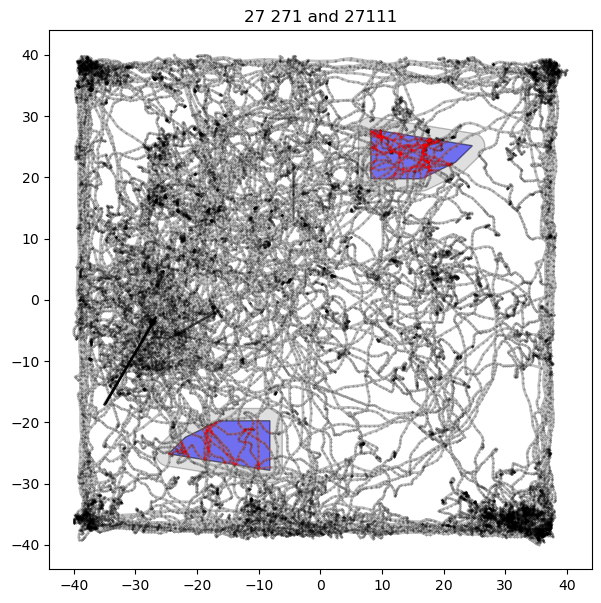

Unique intersecting points in DataFrame: 240
Total ratio: 0.004


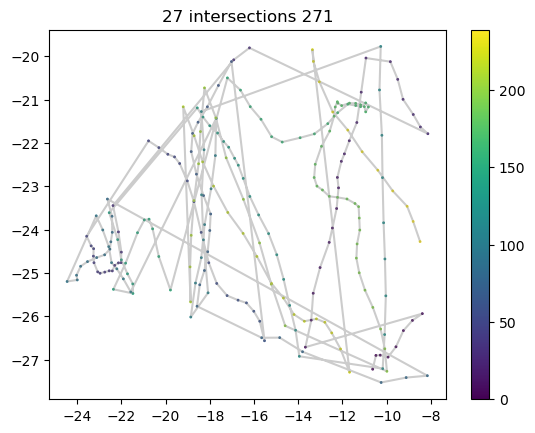

Unique intersecting points in DataFrame: 542
Total ratio: 0.01


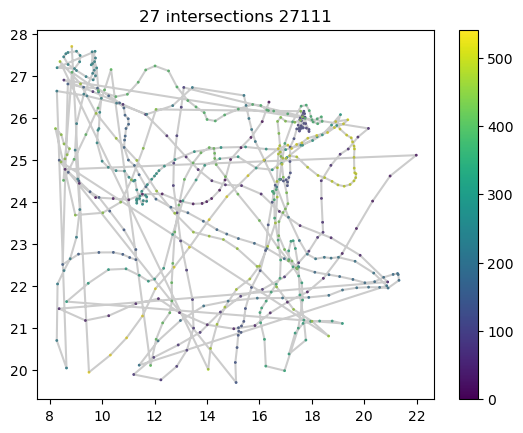

Unique intersecting points in DataFrame: 588
Total ratio: 0.011


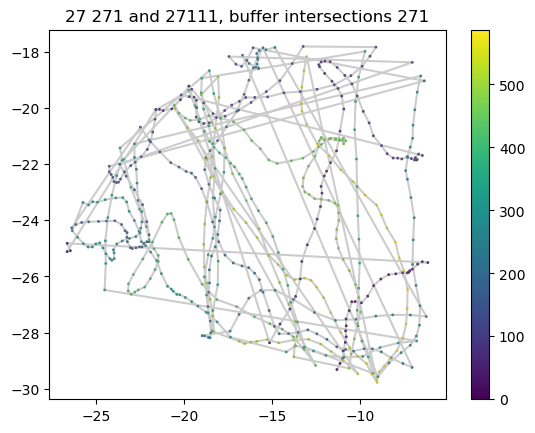

Unique intersecting points in DataFrame: 966
Total ratio: 0.017


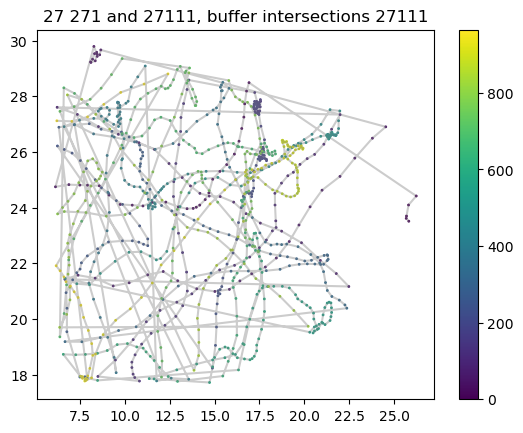

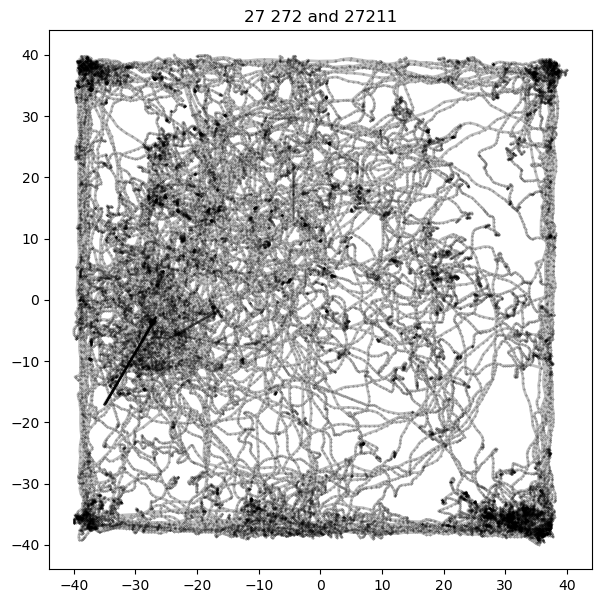

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


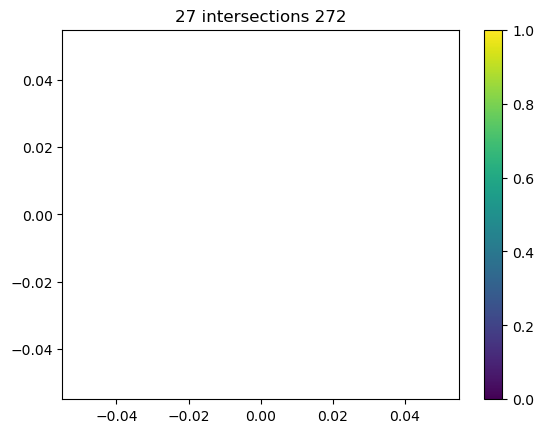

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


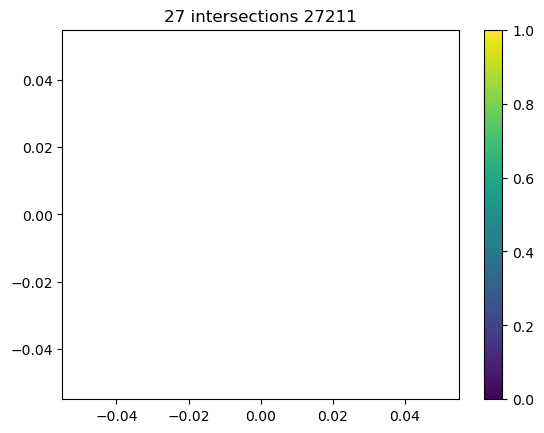

Unique intersecting points in DataFrame: 348
Total ratio: 0.006


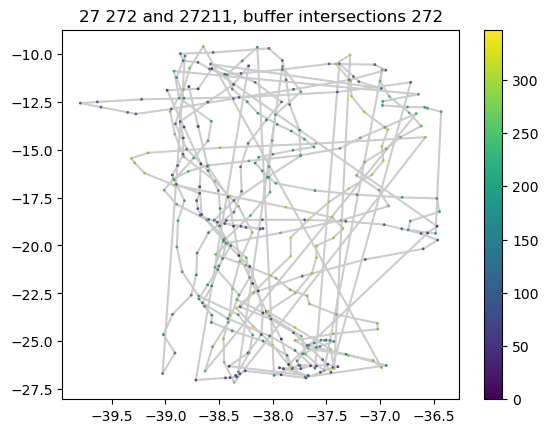

Unique intersecting points in DataFrame: 398
Total ratio: 0.007


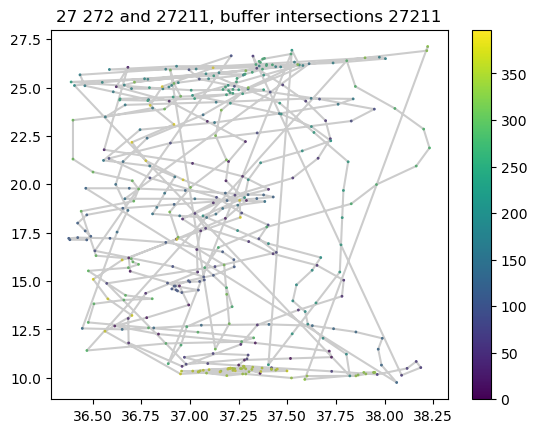

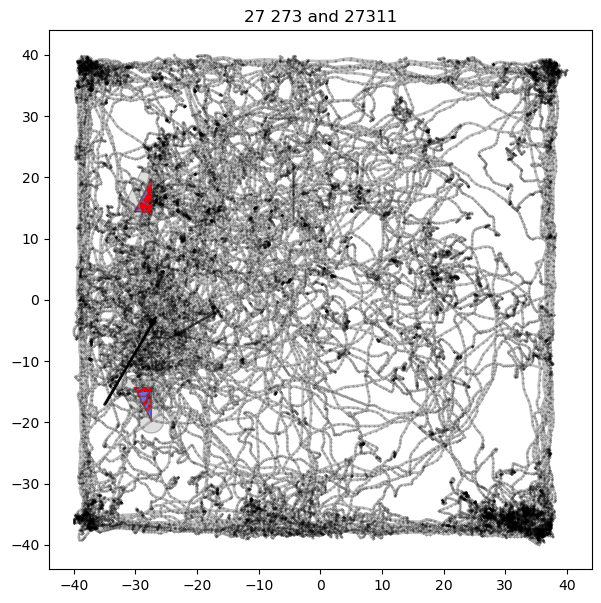

Unique intersecting points in DataFrame: 97
Total ratio: 0.002


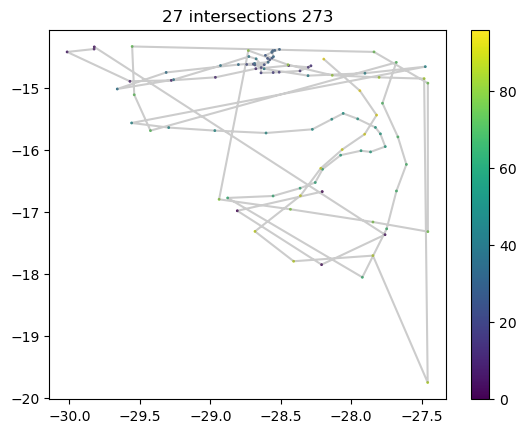

Unique intersecting points in DataFrame: 165
Total ratio: 0.003


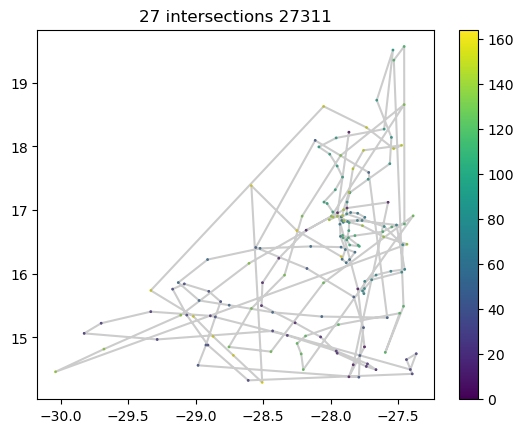

Unique intersecting points in DataFrame: 398
Total ratio: 0.007


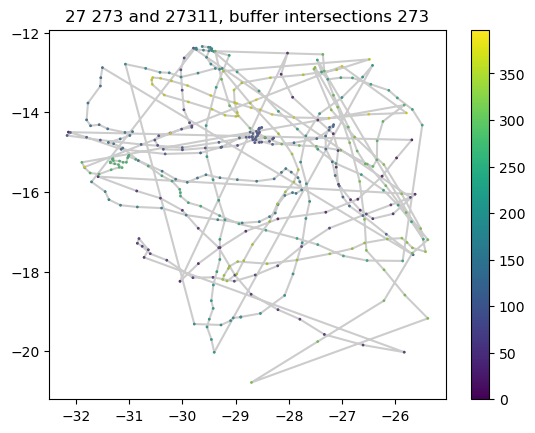

Unique intersecting points in DataFrame: 798
Total ratio: 0.014


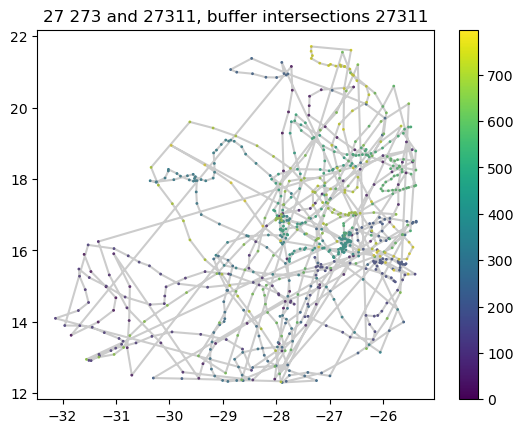

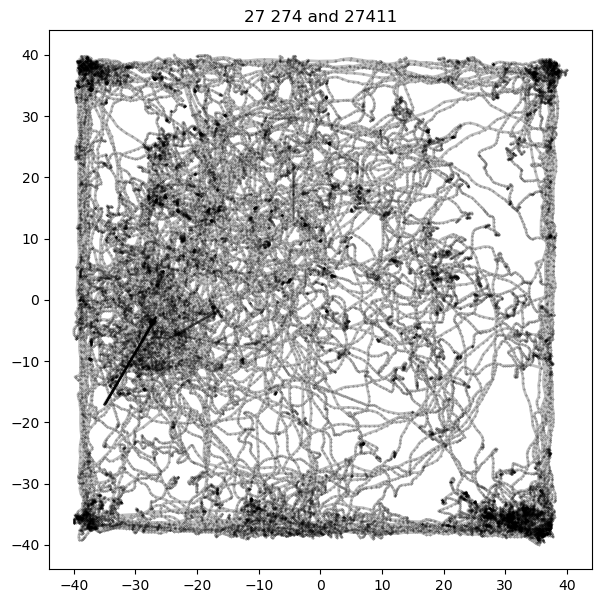

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


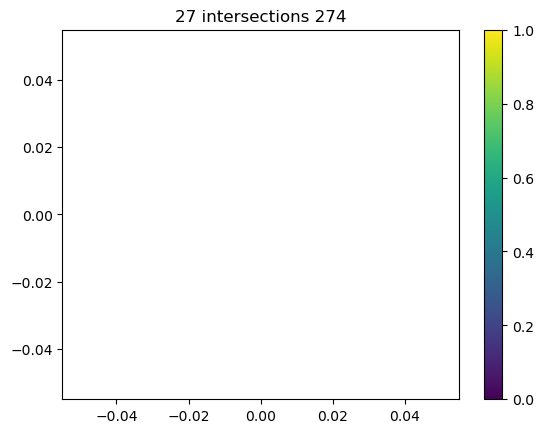

Unique intersecting points in DataFrame: 0
Total ratio: 0.0


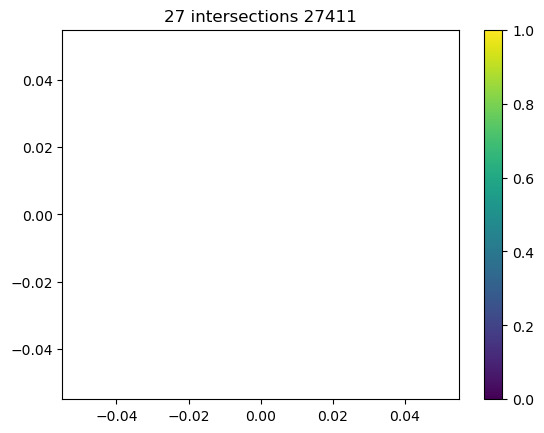

Unique intersecting points in DataFrame: 47
Total ratio: 0.001


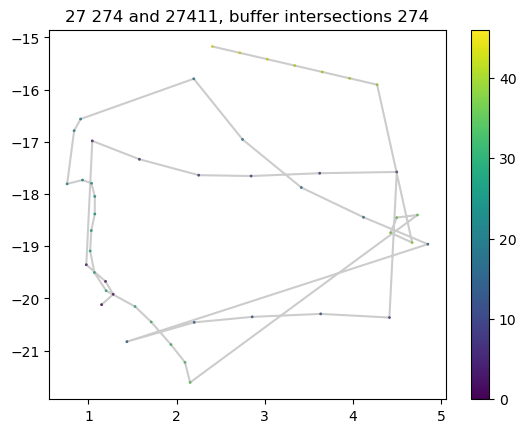

Unique intersecting points in DataFrame: 223
Total ratio: 0.004


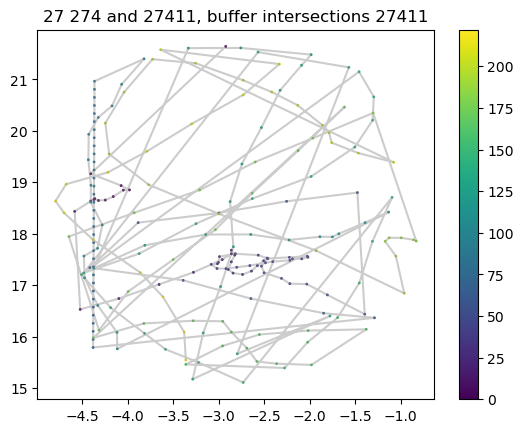

In [98]:
#2. find intersections with polygons, polygon buffers

dict_inter = {}
dict_buff = {}
polygon_names = []

# Calculate trajectory parts intersected with marks

#for comparison_pair in comparison_list:
for i in range(len(comparison_list)):
    comparison_pair = comparison_list[i]
    traj = dfs_step_sum_cut
    name_i = comparison_list[i][0][2]
    name_i_f = comparison_list[i][1][2]

    # for marks
    inters = find_traj_marks_intersections(tr=traj.copy(),
                                           marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
    df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
                                                      marks_interections=inters,
                                                      buff=False, title=str(k)+' intersections')
    df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
                                                                marks_interections=inters,
                                                                buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
    dict_inter[name_i] = tr_new
    dict_buff[name_i] = tr_new_buff
    polygon_names.append(name_i)
    #break

# форма распределения длины шагов, форма распределения углов поворота
# количество сэмплов остановки, кол-во сэмплов бега
big_dict_inter[k] = dict_inter
big_dict_buff[k] = dict_buff


In [166]:
# del big_dict_inter['5']

18
3


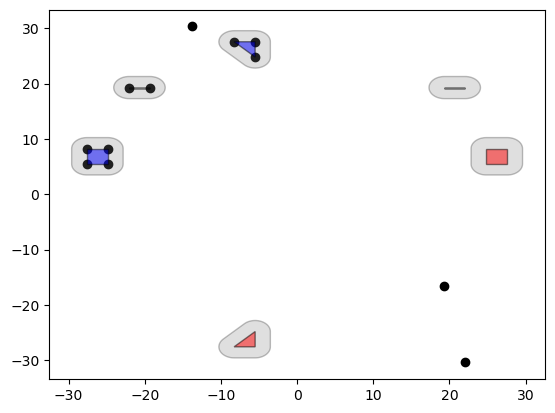

In [180]:
# comparison_list = []

# k = 18
# k_old=k
# poly_list = marks_poly_df[k]
# print(k)
# print(len(poly_list))  # [poly, buffer, lab]


# # Calculate trajectory parts intersected with marks

# #plot_shapely_traj(to_shapely_traj(traj))

# trN_coords = coords_dict[k]
# trN_coords_x = [i[0] for i in trN_coords]
# trN_coords_y = [i[1] for i in trN_coords]
# plt.scatter(trN_coords_x, trN_coords_y, color='black')

# #0 polygon
# poly, buffer, lab = poly_list[0]
# poly_f = hflip(poly)
# buffer_f = hflip(buffer)
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 180],
#                         [poly_f, buffer_f, 18011]])

# #1 polygon
# poly, buffer, lab = poly_list[1]
# poly_f = hflip(poly)
# buffer_f = hflip(buffer)
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 181],
#                         [poly_f, buffer_f, 18111]])

# #2 polygon - flipped пересекается с точкой
# poly, buffer, lab = poly_list[2]
# poly_f = vflip(poly)
# buffer_f = vflip(buffer)
# plot_shapely_mark(poly, buffer)
# plot_shapely_mark(poly_f, buffer_f,
#                label='flipped', color='red')
# comparison_list.append([[poly, buffer, 182],
#                         [poly_f, buffer_f, 18211]])


# dict_compar_lists[k] = comparison_list

In [99]:
# #2. find intersections with polygons, polygon buffers

# dict_inter = {}
# dict_buff = {}
# polygon_names = []

# # Calculate trajectory parts intersected with marks

# #for comparison_pair in comparison_list:
# for i in range(len(comparison_list)):
#     comparison_pair = comparison_list[i]
#     traj = dfs_step_sum_cut
#     name_i = comparison_list[i][0][2]
#     name_i_f = comparison_list[i][1][2]

#     # for marks
#     inters = find_traj_marks_intersections(tr=traj.copy(),
#                                            marks_poly_list=comparison_pair,title=str(k)+' '+str(name_i) +' and ' +str(name_i_f))
#     df_inters, tr_new = extract_shapely_intersections(tr=traj.copy(),
#                                                       marks_interections=inters,
#                                                       buff=False, title=str(k)+' intersections')
#     df_inters_buff, tr_new_buff = extract_shapely_intersections(tr=traj.copy(),
#                                                                 marks_interections=inters,
#                                                                 buff=True, title=str(k)+' '+str(name_i)+' and ' +str(name_i_f)+ ', buffer intersections')
#     dict_inter[name_i] = tr_new
#     dict_buff[name_i] = tr_new_buff
#     #dict_tr6_inter[k+'_'+str(name_i)] = df_inters
#     #dict_tr6_buff[k+'_'+str(name_i)] = df_inters_buff
#     polygon_names.append(name_i)
#     #break

# # форма распределения длины шагов, форма распределения углов поворота
# # количество сэмплов остановки, кол-во сэмплов бега
# big_dict_inter[k] = dict_inter
# big_dict_buff[k] = dict_buff


In [100]:
big_dict_inter

{22: {220:               time          x          y         Vx        Vy          V  \
  1         0.041890 -23.762011 -37.256180  16.958517  0.284574  16.960968   
  2         0.074185 -22.986429 -37.243147  19.686326  0.327812  19.689528   
  3         0.105430 -22.210846 -37.230114  21.990720  0.353474  21.996086   
  4         0.137980 -21.435263 -37.217080  23.331552  0.325238  23.344305   
  5         0.170210 -20.659680 -37.204047  23.789256  0.180666  23.824049   
  ...            ...        ...        ...        ...       ...        ...   
  55453  1843.370607 -33.995378  21.667302   1.363840  1.679064   3.443936   
  55454  1843.402505 -33.973137  21.707310   0.264706  2.171125   3.545465   
  55455  1843.434671 -34.000440  21.878994  -1.004186  2.471954   3.884744   
  55456  1843.467657 -34.083313  21.923139  -2.162405  2.629422   4.291526   
  55457  1843.498761 -34.262325  22.015415  -2.864510  2.686053   4.566024   
  
         step_length      angles  near_wall  step_su

In [101]:
DIR

'neuro_preprocessed_dataset/mouse5'

In [102]:
pickle.dump(big_dict_inter, open( DIR+"/big_dict_inter.p", "wb"))
pickle.dump(big_dict_buff, open( DIR+"/big_dict_buff.p", "wb"))

##### stats

In [117]:
big_dict_inter.keys()

dict_keys([22, 27, 14])

###### 14

In [119]:
# big_dict_buff

In [120]:
for a, aa in big_dict_buff.items():
    print(a)
    for b, bb in aa.items():
        print(b)
        print(bb['intersection'].value_counts())

22
220
intersection
0.0        55048
22011.0      228
220.0        181
Name: count, dtype: int64
27
270
intersection
0.0        54709
27011.0      581
270.0        167
Name: count, dtype: int64
271
intersection
0.0        53903
27111.0      966
271.0        588
Name: count, dtype: int64
272
intersection
0.0        54711
27211.0      398
272.0        348
Name: count, dtype: int64
273
intersection
0.0        54261
27311.0      798
273.0        398
Name: count, dtype: int64
274
intersection
0.0        55187
27411.0      223
274.0         47
Name: count, dtype: int64
14
140
intersection
0.0        53992
14011.0     1004
140.0        461
Name: count, dtype: int64
141
intersection
0.0        53743
141.0        884
14111.0      830
Name: count, dtype: int64
143
intersection
0.0        54807
14311.0      582
143.0         68
Name: count, dtype: int64


In [121]:
# pd.concat([means_step_l,lildf2])

140


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


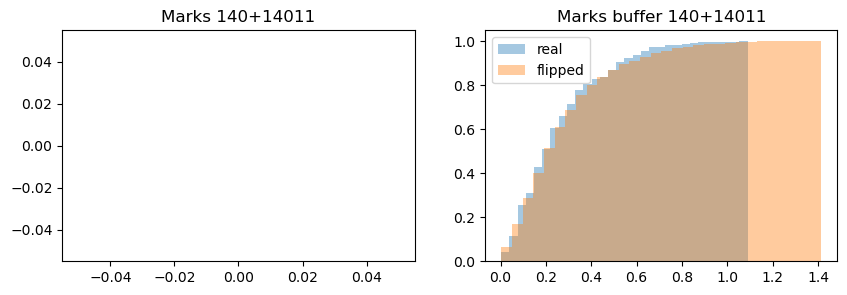

(0,) (0,)
intersection l = 0
(461,) (1004,)
buffer
U1, p
219069.0 0.10044257122618501
mean of original polygon buffer, std
0.2614403969770701 0.1862702897750801
mean of flipped polygon buffer
0.2854301505977379 0.21403142672359887


141


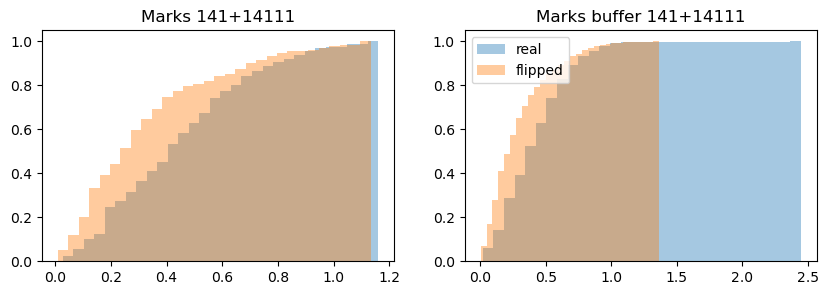

(281,) (239,)
intersection
U1, p
44033.0 9.265904475178721e-10
mean of original polygon, std
0.44905680594186137 0.25180036524577126
mean of flipped polygon, std
0.32773717576979533 0.25656784144150596
(884,) (830,)
buffer
U1, p
500003.0 1.191763009841907e-38
mean of original polygon buffer, std
0.43811985899090344 0.2505382490205993
mean of flipped polygon buffer
0.29801591237571073 0.23472825948831896


143


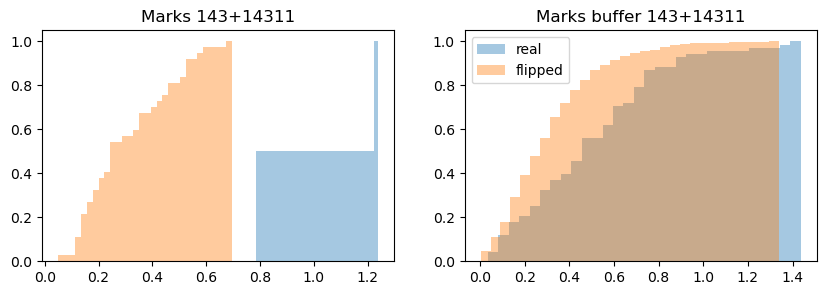

(2,) (37,)
intersection
U1, p
74.0 0.002699055330634278
mean of original polygon, std
1.0113574134081074 0.2272025850650019
mean of flipped polygon, std
0.31372634387385695 0.1633242160413329
(68,) (582,)
buffer
U1, p
27203.0 4.188587262650529e-07
mean of original polygon buffer, std
0.5058296371211498 0.30781997447587733
mean of flipped polygon buffer
0.31931452694841617 0.21297060474319876




In [122]:
# 3. Step length parameter. Plot cumulative plots, print means, stds, statistics 
means_step_l = pd.DataFrame()

q = 14

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf1])
        #means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf2])
        #means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [123]:
DIR

'neuro_preprocessed_dataset/mouse5'

In [124]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean,std
0,140,buffer,0.100443,219069.0,orig,0.261440,0.186270
1,140,buffer,,,flipped,0.285430,0.214031
0,141,intersect,0.0,44033.0,orig,0.449057,0.186270
1,141,intersect,,,flipped,0.327737,0.214031
0,141,buffer,0.0,500003.0,orig,0.438120,0.250538
1,141,buffer,,,flipped,0.298016,0.234728
0,143,intersect,0.002699,74.0,orig,1.011357,0.250538
1,143,intersect,,,flipped,0.313726,0.234728
0,143,buffer,0.0,27203.0,orig,0.505830,0.307820
1,143,buffer,,,flipped,0.319315,0.212971


###### 22

220


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


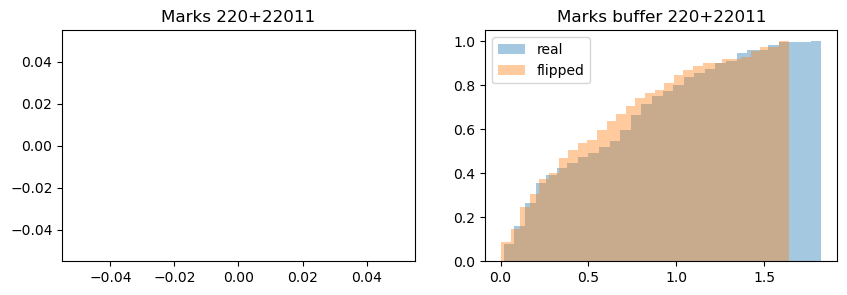

(0,) (0,)
intersection l = 0
(181,) (228,)
buffer
U1, p
22062.0 0.22929523404216912
mean of original polygon buffer, std
0.6098734372473454 0.4562068012815577
mean of flipped polygon buffer
0.5543635470139396 0.44210960125985244




In [125]:
means_step_l = pd.DataFrame()

q = 22

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf1])
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf2])
    else:
        print('buffer l = 0')
    print('\n')
    

In [126]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean,std
0,220,buffer,0.229295,22062.0,orig,0.609873,0.456207
1,220,buffer,,,flipped,0.554364,0.442110


###### 27 - пока забьем - или нет

270


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


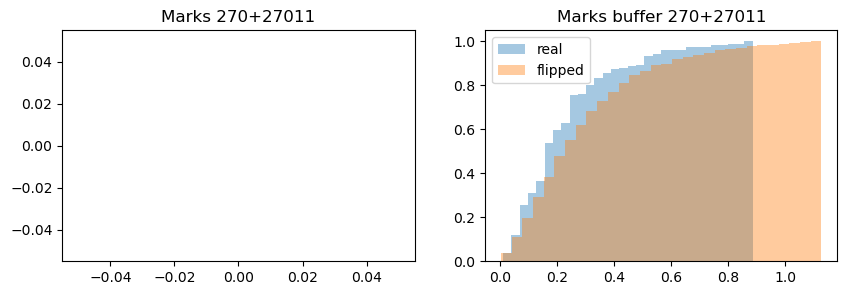

(0,) (0,)
intersection l = 0
(167,) (581,)
buffer
U1, p
39449.0 0.00023033307023897
mean of original polygon buffer, std
0.23013195633473638 0.1719968146339412
mean of flipped polygon buffer
0.29615753647141074 0.21778056093004466


271


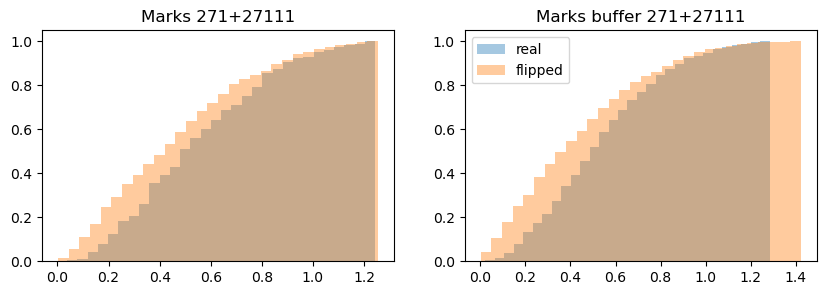

(240,) (542,)
intersection
U1, p
77858.0 1.0847788037731928e-05
mean of original polygon, std
0.5537223642024617 0.2672509383617906
mean of flipped polygon, std
0.46322221802557156 0.28698406823195804
(588,) (966,)
buffer
U1, p
350156.0 1.2523242003750811e-14
mean of original polygon buffer, std
0.5397230849183663 0.2621858878584343
mean of flipped polygon buffer
0.4371848366933619 0.2960940925641373


272


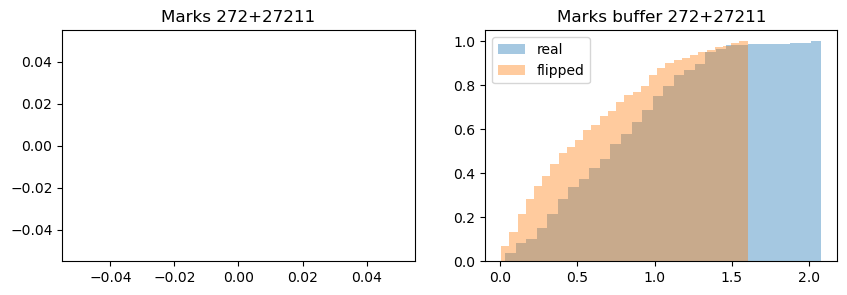

(0,) (0,)
intersection l = 0
(348,) (398,)
buffer
U1, p
89406.0 6.71636693437275e-12
mean of original polygon buffer, std
0.7568075360850904 0.41589482126216143
mean of flipped polygon buffer
0.5513068128780152 0.410921561553123


273


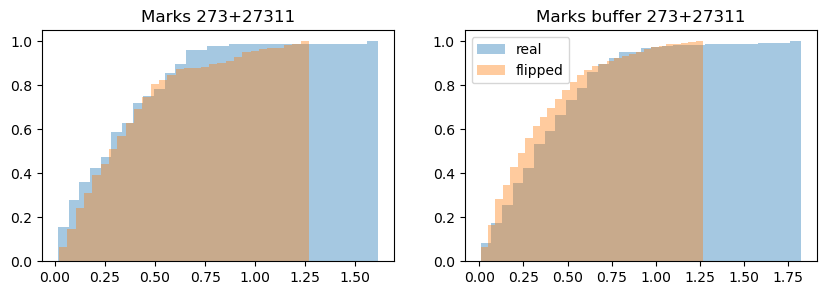

(97,) (165,)
intersection
U1, p
7428.0 0.332463894923985
mean of original polygon, std
0.32713873698073964 0.25729681295523227
mean of flipped polygon, std
0.36615204668450485 0.281597966364846
(398,) (798,)
buffer
U1, p
182973.0 1.752936435618398e-05
mean of original polygon buffer, std
0.40096636457728907 0.2918089021024042
mean of flipped polygon buffer
0.3365766903338744 0.2685378619981708


274


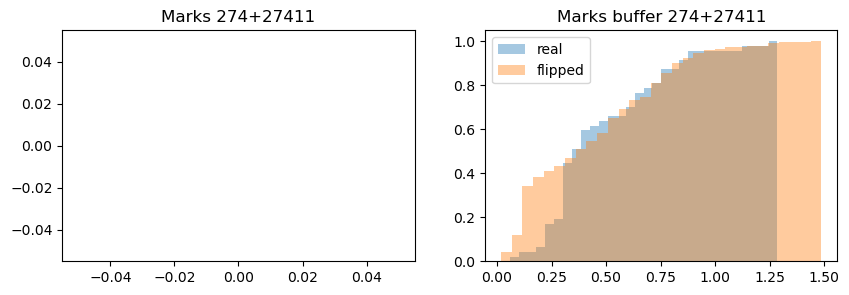

(0,) (0,)
intersection l = 0
(47,) (223,)
buffer
U1, p
5945.0 0.14788023880858117
mean of original polygon buffer, std
0.4857019544842312 0.26386889828117194
mean of flipped polygon buffer
0.441602397580049 0.3146324415127576




In [128]:
means_step_l = pd.DataFrame()

q = 27

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf1])
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf2])
    else:
        print('buffer l = 0')
    print('\n')
    

In [130]:
#means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean,std
0,270,buffer,0.00023,39449.0,orig,0.230132,0.171997
1,270,buffer,,,flipped,0.296158,0.217781
0,271,intersect,0.000011,77858.0,orig,0.553722,0.171997
1,271,intersect,,,flipped,0.463222,0.217781
0,271,buffer,0.0,350156.0,orig,0.539723,0.262186
1,271,buffer,,,flipped,0.437185,0.296094
0,272,buffer,0.0,89406.0,orig,0.756808,0.415895
1,272,buffer,,,flipped,0.551307,0.410922
0,273,intersect,0.332464,7428.0,orig,0.327139,0.415895
1,273,intersect,,,flipped,0.366152,0.410922


###### 18

180


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


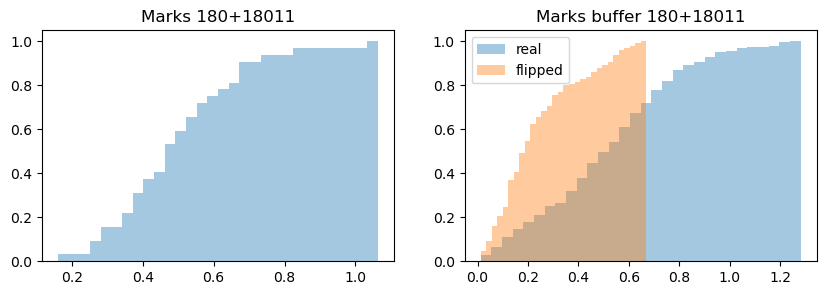

(32,) (0,)
intersection l = 0
(214,) (130,)
buffer
U1, p
22278.0 8.267732359900206e-21
mean of original polygon buffer, std
0.5227368110733579 0.27872236119155475
mean of flipped polygon buffer
0.23634847505309717 0.1656208132338448


181


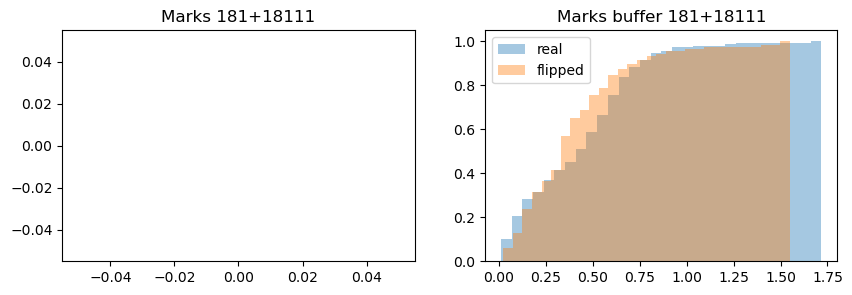

(0,) (0,)
intersection l = 0
(155,) (118,)
buffer
U1, p
9870.0 0.26224238256460486
mean of original polygon buffer, std
0.4357464192379824 0.2954896271688998
mean of flipped polygon buffer
0.405857799413928 0.2889912158627002


182


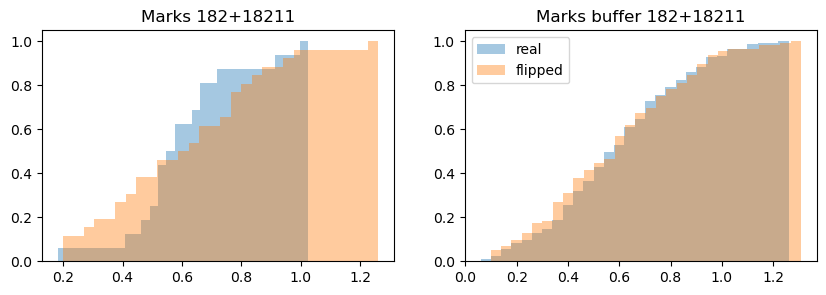

(16,) (26,)
intersection
U1, p
202.0 0.8867219888902523
mean of original polygon, std
0.5991865101218472 0.19055567962956618
mean of flipped polygon, std
0.6107042375345533 0.2625234508465967
(165,) (116,)
buffer
U1, p
9909.0 0.6137528017741739
mean of original polygon buffer, std
0.6007602376291296 0.2557029225965655
mean of flipped polygon buffer
0.5874029276357159 0.2747402333564234




In [210]:
means_step_l = pd.DataFrame()

q = 18

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf1])
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()],'std':[n1buff.std(), n2buff.std()]})
        means_step_l = pd.concat([means_step_l,lildf2])
    else:
        print('buffer l = 0')
    print('\n')
    

In [211]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean,std
0,180,buffer,0.0,22278.0,orig,0.522737,0.278722
1,180,buffer,,,flipped,0.236348,0.165621
0,181,buffer,0.262242,9870.0,orig,0.435746,0.295490
1,181,buffer,,,flipped,0.405858,0.288991
0,182,intersect,0.886722,202.0,orig,0.599187,0.295490
1,182,intersect,,,flipped,0.610704,0.288991
0,182,buffer,0.613753,9909.0,orig,0.600760,0.255703
1,182,buffer,,,flipped,0.587403,0.274740


###### not needed

180


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\numpy\lib\histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


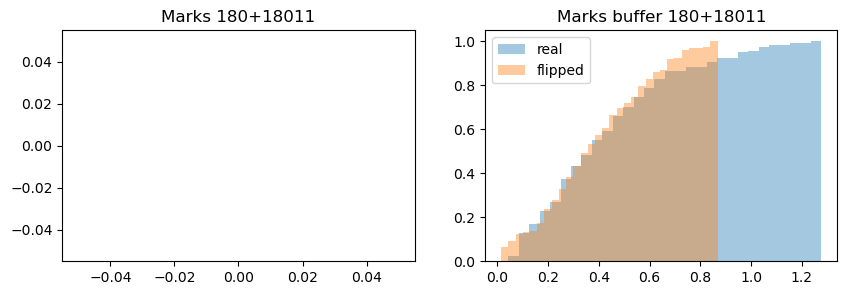

(0,) (0,)
intersection l = 0
(118,) (122,)
buffer
U1, p
7597.0 0.45861967517516133
mean of original polygon buffer, std
0.43180908537601925 0.2728060243392771
mean of flipped polygon buffer
0.38502943512140575 0.21653936230606968




C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13600\356202089.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  means_step_l = means_step_l.append(lildf2)


In [434]:
means_step_l = pd.DataFrame()

q = 18

#plot step_length
for tr_key in big_dict_inter[q]:
    print(tr_key)
    int_key1 = tr_key
    int_key2 = int(str(tr_key)+'11')
    tr_new = big_dict_inter[q][tr_key]
    tr_new_buff = big_dict_buff[q][tr_key]
    
    m = tr_new['step_length'].loc[tr_new['intersection'] == int_key1]
    m_f = tr_new['step_length'].loc[tr_new['intersection'] == int_key2]

    mbuff = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key1]
    mbuff_f = tr_new_buff['step_length'].loc[tr_new_buff['intersection'] == int_key2]

    # Step len distributions
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax[0].hist(m.to_numpy(), alpha=0.4, label='real',
               cumulative=True, density=True, bins=30)
    ax[0].hist(m_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)

    # cdf1 = scipy.stats.norm.cdf(m.to_numpy())
    # cdf2 = scipy.stats.norm.cdf(m_f.to_numpy())
    # sns.lineplot(x=m.to_numpy(), y=cdf1, ax=ax[0])
    # sns.lineplot(x=m_f.to_numpy(), y=cdf2, ax=ax[0])

    ax[0].set_title('Marks'+' '+str(int_key1)+'+'+str(int_key2))

    ax[1].hist(mbuff.to_numpy(), alpha=0.4, label='real',
               cumulative=True,  density=True, bins=30)
    ax[1].hist(mbuff_f.to_numpy(), alpha=0.4, label='flipped',
               cumulative=True,  density=True, bins=30)
    ax[1].set_title('Marks buffer'+' '+str(int_key1)+'+'+str(int_key2))
    
    plt.legend()
    plt.show()
    
    #statistics
    n1 = m.to_numpy() 
    n2 = m_f.to_numpy()
    print(n1.shape, n2.shape)
    if len(n1) > 0 and len(n2) > 0:
        U1, p = mannwhitneyu(n1, n2,)
        print('intersection')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon, std')
        print(n1.mean(), n1.std())
        print('mean of flipped polygon, std')
        print(n2.mean(), n2.std())
        lildf1 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['intersect', 'intersect'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1.mean(), n2.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = means_step_l.append(lildf1)
    else:
        print('intersection l = 0')
    
    #statistics
    n1buff = mbuff.to_numpy() 
    n2buff = mbuff_f.to_numpy()
    print(n1buff.shape, n2buff.shape)
    if len(n1buff) > 0 and len(n2buff) > 0:
        U1, p = mannwhitneyu(n1buff, n2buff,)
        print('buffer')
        print('U1, p')
        print(U1, p)
        print('mean of original polygon buffer, std')
        print(n1buff.mean(), n1buff.std())
        print('mean of flipped polygon buffer')
        print(n2buff.mean(), n2buff.std())
        lildf2 = pd.DataFrame({'name':[tr_key, tr_key], 'inter/buffer':['buffer', 'buffer'], 'p':[p, ''], 'U1':[U1, ''], 'orig/flipped': ['orig', 'flipped'], 'mean':[n1buff.mean(), n2buff.mean()], 'std':[n1buff.std(), n2buff.std()]})
        means_step_l = means_step_l.append(lildf2)
    else:
        print('buffer l = 0')
    print('\n')
    

In [436]:
means_step_l.to_csv(DIR+'/'+str(q)+'out.csv', index=False)
means_step_l

,name,inter/buffer,p,U1,orig/flipped,mean
0,180,buffer,0.45862,7597.0,orig,0.431809
1,180,buffer,,,flipped,0.385029


# old

### old intersections

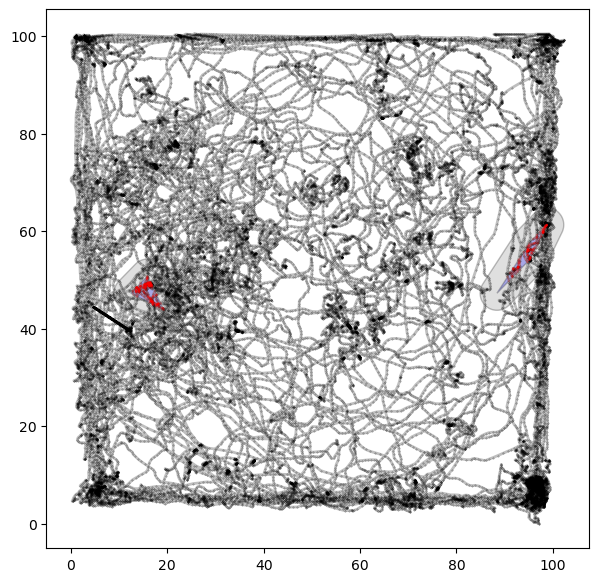

In [194]:
from shapely.geometry import LineString, MultiLineString


def plot_intersected_element(intersection):
    if intersection.geom_type == 'MultiLineString':
        for geom in intersection.geoms:
            x, y = geom.xy
            plt.plot(x, y, color='red', linewidth=1.5,
                    alpha=0.2, zorder=4)
    elif intersection.geom_type == 'LineString':
        x, y = intersection.xy
        plt.plot(x, y, color='red', linewidth=1.5,
                alpha=0.2, label='Intersection', zorder=4)


def plot_shapely_traj(trajectory):
    x, y = trajectory.xy
    plt.plot(x, y, color='grey', linewidth=2,
             label='Trajectory', alpha=0.5)
    plt.plot(x, y, color='black',  marker='o', ls='',
             markersize=0.3, alpha=0.5)


def plot_shapely_marks(polygon, poly_buffer):
    # plot mark poly + buffer
    x_zone, y_zone = poly_buffer.exterior.xy
    plt.fill(x_zone, y_zone, alpha=0.25, linewidth=1, linestyle='-',
                edgecolor='black', facecolor='gray', label='Zone Polygon')
    x_poly, y_poly = polygon.exterior.xy
    plt.fill(x_poly, y_poly, alpha=0.25, linewidth=1, linestyle='-',
                facecolor='blue', edgecolor='black', label='')


def find_traj_marks_intersections(tr, marks_poly_list, show=True):
    """
    tr: df with trajectory and x,y coordinates
    marks_poly_list: 
    """
    points = tr[['x', 'y']].to_numpy()
    trajectory_points = [(xy[0], xy[1]) for xy in points]
    trajectory = LineString(trajectory_points)

    plt.figure(figsize=(7, 7))
    marks_interections = []
    for polygon, poly_buffer, lab in marks_poly_list:

        intersection = polygon.intersection(trajectory)
        intersection_buffer = poly_buffer.intersection(trajectory)
        marks_interections.append([intersection, intersection_buffer, lab])

        # plotting traj, marks and intersections
        if not intersection.is_empty and show:
            plot_intersected_element(intersection)
            #print('intersection_buffer', intersection_buffer)
            plot_shapely_marks(polygon, poly_buffer)
            #print('polygon', polygon)
    if show:
        plot_shapely_traj(trajectory)
        plt.show()

    return marks_interections


marks_interections = find_traj_marks_intersections(traj_whole, all_polygons[4])

In [191]:
marks_poly_list

[[<POLYGON ((39.83 12.599, 43.302 12.599, 39.83 12.599, 43.302 12.599, 39.83 1...>,
  <POLYGON ((36.33 12.599, 36.346 12.942, 36.397 13.282, 36.48 13.615, 36.596 ...>,
  0],
 [<POLYGON ((15.525 26.609, 15.525 30.112, 15.525 30.112, 15.525 26.609))>,
  <POLYGON ((19.025 26.609, 19.008 26.266, 18.957 25.927, 18.874 25.593, 18.75...>,
  1]]

In [190]:
marks_interections

[[<LINESTRING EMPTY>,
  <MULTILINESTRING ((36.332 12.559, 36.353 12.611, 36.409 13.04, 36.543 13.351...>,
  0],
 [<LINESTRING EMPTY>,
  <MULTILINESTRING ((16.89 33.333, 16.888 33.277, 16.924 33.169, 16.872 33.022...>,
  1]]

In [133]:
traj_whole

,time,x,y
0,0.030712,4.635214,47.569576
1,0.078213,4.113290,47.997292
2,0.110699,3.769167,48.431576
3,0.143199,3.492345,49.000769
4,0.174277,3.255000,49.516360
...,...,...,...
58516,1945.185707,25.374909,59.364462
58517,1945.218450,25.514591,58.635894
58518,1945.250936,25.562193,57.877963
58519,1945.282616,25.698466,57.206190


### old, their heatmaps of cell firing

In [15]:
pwd

'C:\\Users\\dmitry.plotnikov\\analysis'

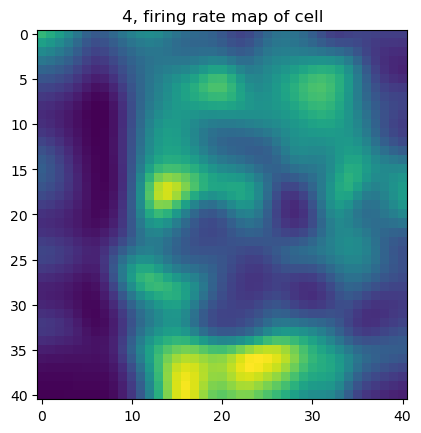

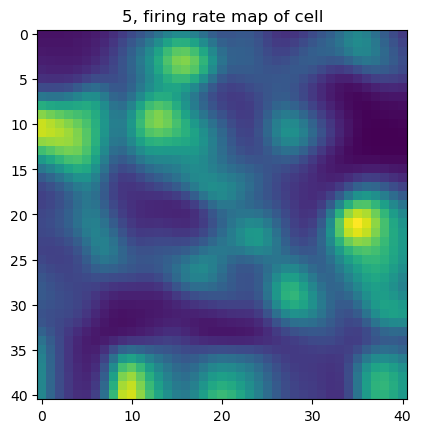

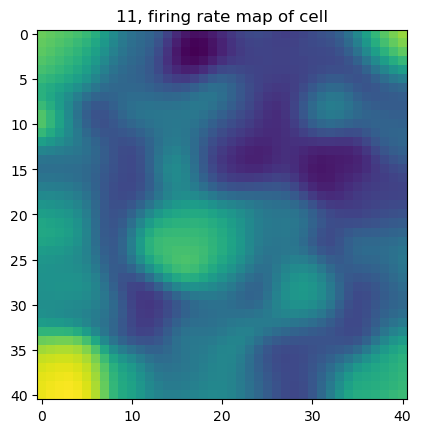

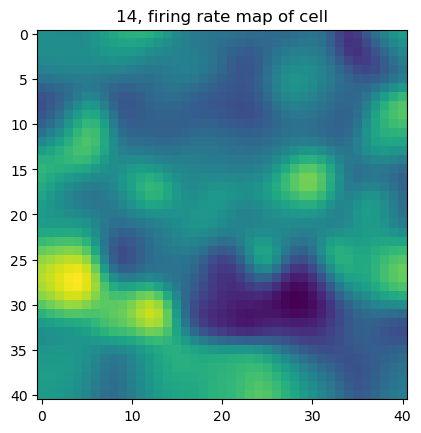

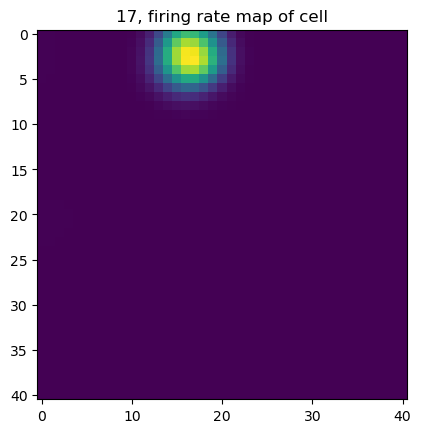

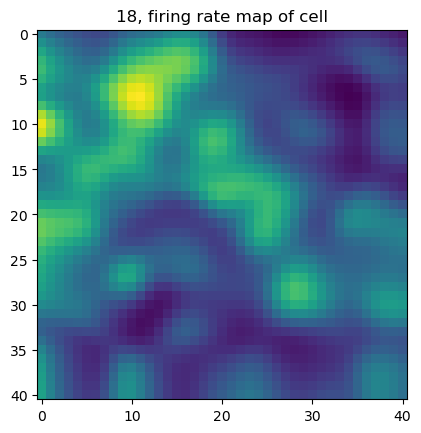

In [18]:
for n in clust_ns:
    hm = df_1sess.loc[df_1sess['cluster_id']==n]['firing_maps'].values[0]
    # hm_clusters['signal'+str(i)] = hm
    plt.imshow(hm)
    plt.title( str(n)+ ", firing rate map of cell" ) 
    plt.savefig('C:\\Users\\dmitry.plotnikov\\analysis\\their_cell_HM\\'+str(n)+'hm.png')
    plt.show()

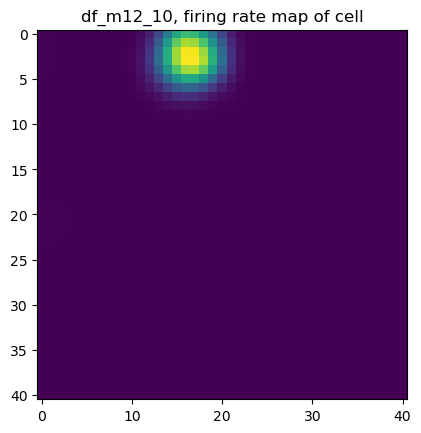

In [14]:
n=17
hm = df_1sess.loc[df_1sess['cluster_id']==n]['firing_maps'].values[0]
# hm_clusters['signal'+str(i)] = hm
plt.imshow(hm)
plt.title( k+ ", firing rate map of cell" ) 
#plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+k+'hm.png')
plt.show() 

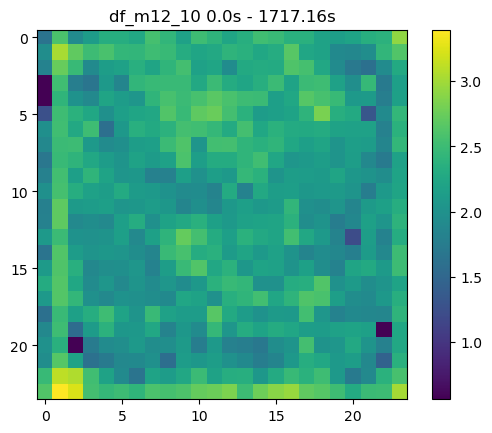

In [93]:
# #occupancy map
# k = 'df_m12_10'
# k_add = ' '+str(round(resampled_df['time'].min(),2))+'s - '+str(round(resampled_df['time'].max(), 2))+'s' 
# occ = occupMapNorm(resampled_df[['time', 'x', 'y']], binn=25)

# # sns.heatmap(occ, square=True, xticklabels=False,
# #             yticklabels=False, cmap='Blues')
# #occ_s = fourier_gaussian(occ, 0.8, n=-1)
# plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
# plt.title(k + k_add)
# plt.colorbar()
# k_add2 = '_'+str(round(resampled_df['time'].min(),2))+'s_ '+str(round(resampled_df['time'].max(), 2))+'s'
# # plt.savefig(d+'occ_map_'+k+k_add2+'.png')
# plt.show()

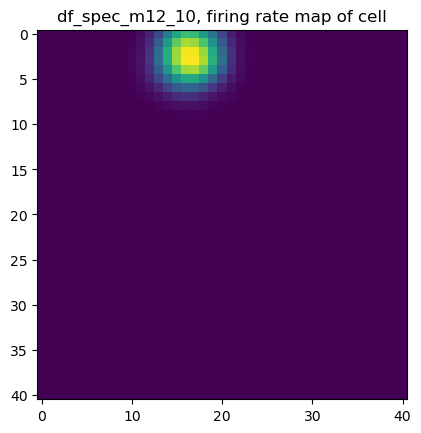

In [112]:
# i=17
# hm = df_1sess.loc[df_1sess['cluster_id']==i]['firing_maps'].values[0]
# # hm_clusters['signal'+str(i)] = hm
# plt.imshow(hm)
# plt.title( k+ ", firing rate map of cell" ) 
# #plt.savefig('C:\\Users\\Lenovo\\1navigation\\output\\'+k+'hm.png')
# plt.show() 

#### если делать количество точек выше какого-то порога

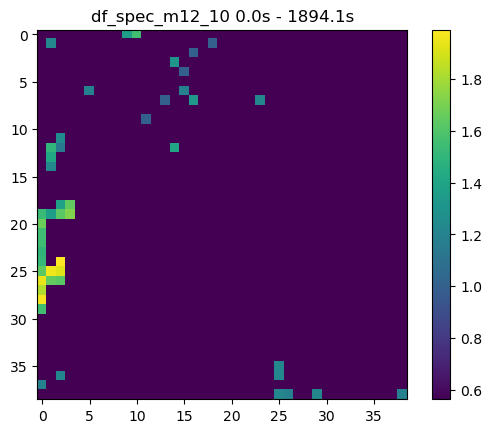

In [138]:
df_spec = resampled_df_2.loc[resampled_df_2['signal17']>=0.001]
k = 'df_spec_m12_10'
k_add = ' '+str(round(df_spec['time'].min(),2))+'s - '+str(round(df_spec['time'].max(), 2))+'s' 
occ = occupMapNorm(df_spec[['time', 'x', 'y']], binn=40)
plt.imshow(occ) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()


In [141]:
smoothed_matrix3 = gaussian_filter(occ3, sigma=1)
plt.imshow(smoothed_matrix3)

NameError: name 'occ3' is not defined

##### если брать среднюю активность нейрона в этой точке - что-то не так

In [63]:
def occupMean(df, binn, s='signal19', eps=0.1):
    """ 
    делаем df где будет понятно сколько было точек в каждом бине 
    соответсвуеющему данному интервалу х и данному интервалу у
    """
    xmin = df["x"].min() - eps
    xmax = df["x"].max() + eps
    binx = np.linspace(xmin, xmax, binn)
    x_cut = pd.cut(df.x, binx, right=False)

    ymin = df["y"].min() - eps
    ymax = df["y"].max() + eps
    biny = np.linspace(ymin, ymax, binn)
    y_cut = pd.cut(df.y, biny, right=False)

    dfn = df.groupby([x_cut, y_cut], observed=False).mean()
    
    dfn = dfn.drop(columns=['x', 'y', 'time'])
    dfn = dfn.rename(columns={s: 'mean'})
    
    #сделаем df с норм числами в индексах, а не с интервалами
    L = [(a.mid, b.mid) for a, b in dfn.index]
    dfm = dfn.set_index(pd.MultiIndex.from_tuples(L, names=dfn.index.names))
    
    dd = dfm.unstack()
    arrd = dd.replace(0., 1).to_numpy()
    arrl = np.log(arrd)

    # arrl = df_minmax(arrl)
    return arrl

In [ ]:
resampled_df

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_22940\2187721434.py:27: RuntimeWarning: invalid value encountered in log
  arrl = np.log(arrd)


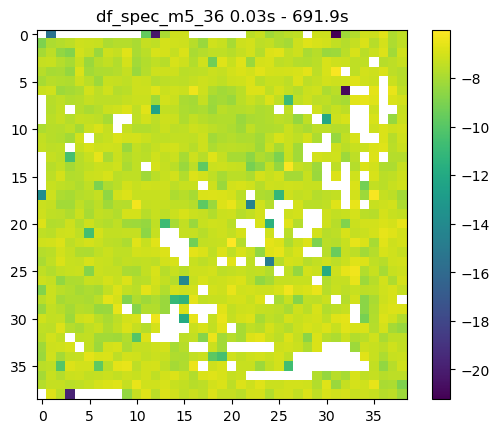

In [65]:
occ_n_m = occupMean(resampled_df[['time', 'x', 'y', 'signal19']], binn=40)
plt.imshow(occ_n_m) #interpolation='bilinear', cmap='rainbow')
plt.title(k + k_add)
plt.colorbar()
k_add2 = '_'+str(round(df_spec['time'].min(),2))+'s_ '+str(round(df_spec['time'].max(), 2))+'s'
plt.show()


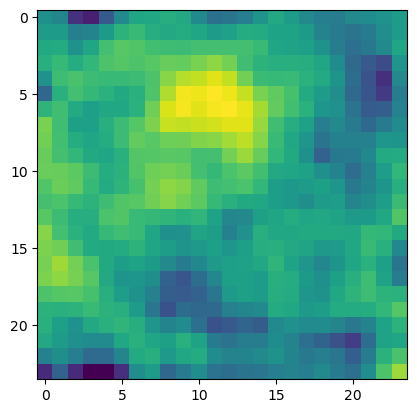

In [54]:
smoothed_matrix2 = gaussian_filter(occ_n_m, sigma=0.7)
plt.imshow(smoothed_matrix2)

### 0.7 the rest

In [130]:

resampled_dfnp = resample(tr_np[:, 1:], num_new_points, axis=0)
new_time = np.linspace(0, max(sign_time), num_new_points)
#new_sign = resample(sign_np[:, 1:], num_new_points, axis=0)
resampled_df_2 = pd.DataFrame({'time': new_time,
                                     'x': resampled_dfnp[:, 0], 
                                     'y': resampled_dfnp[:, 1],
                                    'signal'+str(int(dat1['cluster_id'])):new_sign})


In [132]:
resampled_df_2

,time,x,y,signal17
0,0.000000,4.635214,47.569576,0.001317
1,0.003333,0.983173,50.059208,-0.000240
2,0.006667,-1.732328,51.912037,0.000130
3,0.010000,-3.508213,53.125926,-0.000089
4,0.013333,-4.386152,53.729193,0.000067
...,...,...,...,...
568225,1894.083333,33.749771,27.743530,0.000719
568226,1894.086667,26.976952,32.354032,0.001029
568227,1894.090000,20.497625,36.765345,0.001705
568228,1894.093333,14.507016,40.844658,0.002002


In [133]:
#resampled_df_2.to_pickle('M12_2018-03-26_14-00-10_of_sign17_with_artifact.pkl')